<center>
<h1>Reinforcement Learning</h1>
<h1 style="color:blue">Defining & Solving RL Environments</h1>
</center>

## Part 1 [Total: 30 points] - Defining RL Environments

### 1.1 Deterministic Environment [15 points]

Steps:

1. Define a deterministic environment, where P(s′, r|s, a) = {0, 1}.
2. Run a random agent for at least 10 timesteps to show that the environment logic is defined correctly. Print the current state, chosen action, reward and return your grid world visualization for each step.
Environment requirements:

- Min number of states: 12
- Min number of actions: 4
- Min number of rewards: 4

Environment definition should follow the Gymnasium structure, which includes the basic methods:

```
def __init__:
# Initializes the class
# Define action and observation space
def step:
# Executes one timestep within the environment
# Input to the function is an action
def reset:
# Resets the state of the environment to an initial state
1
def render:
# Visualizes the environment
# Any form like vector representation or visualizing using matplotlib will be sufficient
```

Import Statements

In [1]:
import gym as gym
from gym import spaces
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import numpy as np
import pickle

#### Frozen Lake Environment

Description: The agent is on a frozen lake and must navigate to the goal while avoiding holes and collecting Gems.

In [10]:
class FrozenLakeEnv(gym.Env):
    metadata = {'render.modes': []}
    def __init__(self, gamma=0.9, alpha=0.1, max_timestamp=10):
        self.gamma = gamma
        self.alpha = alpha

        self.obs_space = spaces.Discrete(16)
        self.action_space = spaces.Discrete(4)
        self.max_timestamp = max_timestamp
        self.timestep = 0

        ## STATES SET #############
        self.state = np.zeros((4, 4))
        self.myskater = np.asarray([0, 0])
        self.goal_loc = np.asarray([3, 3])
        self.gem_loc = [np.asarray([0, 2]), np.asarray([3, 2])]
        self.hole_loc = [np.asarray([1, 3]), np.asarray([2, 0])]

        self.state[tuple(self.myskater)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8
        for pos in self.gem_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hole_loc:
            self.state[tuple(pos)] = 0.4
        ##########################
        
        self.prev_state = np.zeros((4, 4))
        self.prev_action = None
        self.penalty_counter = 0  
        self.flag_out_grid = 0  


    def step(self, action):
        self.prev_state = np.copy(self.state)  
        self.prev_action = action  
        self.flag_out_grid = 0  

        ## ACTIONS SET #############
        if action == 0:    # moves right
            self.myskater[0] += 1
        elif action == 1:   # moves left
            self.myskater[0] -= 1
        elif action == 2:   # moves up
            self.myskater[1] += 1 
        elif action == 3:    # moves down
            self.myskater[1] -= 1
        ##########################
            
        self.myskater = np.clip(self.myskater, 0, 3)

        # If the agent is in the same position as the previous step, choose a different action
        prev_state_positions = np.argwhere(self.prev_state == 0.2)
        if len(prev_state_positions) > 0 and np.array_equal(self.myskater, prev_state_positions[0]):
            while action == self.prev_action:
                action = self.action_space.sample()
            self.flag_out_grid = 1

        self.state = np.zeros((4, 4))
        self.state[tuple(self.myskater)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8
        for pos in self.gem_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hole_loc:
            self.state[tuple(pos)] = 0.4

        obs = self.state.flatten()
        reward = self.calculate_reward()
        penalty = any(np.array_equal(self.myskater, pos) for pos in self.hole_loc)
        if penalty:
            self.penalty_counter += 1 
        self.timestep += 1

        terminated = True if np.array_equal(self.myskater, self.goal_loc) else self.timestep >= self.max_timestamp
        truncated = True if np.any((self.myskater < 0) | (self.myskater > 3)) else False
        if truncated:
            self.flag_out_grid = 1  

        info = {}

        return self.state.flatten(), reward, terminated, truncated, info

    def reset(self, **kwargs):
        self.state = np.zeros((4, 4))
        self.myskater = np.asarray([0, 0])
        self.state[tuple(self.myskater)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8

        for pos in self.gem_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hole_loc:
            self.state[tuple(pos)] = 0.4

        self.prev_state = np.zeros((4, 4))
        self.prev_action = None
        self.flag_out_grid = 0 
        
        obs = self.state.flatten()
        self.timestep = 0
        info = {}
        self.penalty_counter = 0
        return obs, info

    def calculate_reward(self):
        prev_myskateritions = np.argwhere(self.prev_state == 0.2)
        if prev_myskateritions.size == 0:
            prev_myskaterition = self.myskater
        else:
            prev_myskaterition = prev_myskateritions[0]

        # Calculating distance to goal before and after the step
        prev_distance_to_goal = np.linalg.norm(self.goal_loc - prev_myskaterition)
        current_distance_to_goal = np.linalg.norm(self.goal_loc - self.myskater)


        ## REWARDS SET #############
        if np.array_equal(self.myskater, self.goal_loc):
            reward = 10  # Positive reward for reaching goal
        elif np.array_equal(self.myskater, self.hole_loc[0]):
            reward = -5  # negative reward for reaching holes 1
        elif np.array_equal(self.myskater, self.hole_loc[1]):
            reward = -6   # negative reward for reaching holes 2
        elif np.array_equal(self.myskater, self.gem_loc[0]):
            reward = 5   # positive reward for reaching gems 1
        elif np.array_equal(self.myskater, self.gem_loc[1]):
            reward = 6  # positive reward for reaching gems 2
        elif current_distance_to_goal < prev_distance_to_goal:
            reward = 1  # Positive reward for moving closer to goal
        elif current_distance_to_goal > prev_distance_to_goal:
            reward = -1  # Negative reward for moving away to goal
        else:
            reward = -0.1  # Slight negative reward for no change
        ##########################
        
        return reward
    
    def get_penalty_count(self):
        return self.penalty_counter

    def render(self):
        fig, ax = plt.subplots()
        plt.title('Frozen Lake Environment')

        # Load and display the background image
        background_img = plt.imread('images/frozen_lake.jpg')
        ax.imshow(background_img, extent=(-0.5, 3.5, -0.5, 3.5), origin='upper')

       
        skater_img = plt.imread('images/icons8-skateboard-100.png')
        hole_img = plt.imread('images/icons8-hole-100.png')
        gem_img = plt.imread('images/icons8-gems-100.png')
        goal_img = plt.imread('images/icons8-flag-100.png')
        skater_hole_drown_img = plt.imread('images/agent_hole_drown.png')
        skater_gem_lottery_img = plt.imread('images/agent_gems_lottery.png')
        agent_flag_winner_img = plt.imread('images/agent_flag_winner.png')
        agent_grid_cross_img = plt.imread('images/agent_grid_cross.png')

        # Plot Skater
        myskater = self.myskater
        if self.flag_out_grid:
            skater_img = agent_grid_cross_img
        agent_box = AnnotationBbox(OffsetImage(skater_img, zoom=0.4), myskater, frameon=False)
        ax.add_artist(agent_box)

        # Plot Holes
        for hole_loc in self.hole_loc:
            hole_loc = hole_loc
            if np.array_equal(self.myskater, hole_loc):
                hole_img = skater_hole_drown_img
            else:
                hole_img = plt.imread('images/icons8-hole-100.png')
            rock_box = AnnotationBbox(OffsetImage(hole_img, zoom=0.4), hole_loc, frameon=False)
            ax.add_artist(rock_box)

        # Plot Gems
        for gem_loc in self.gem_loc:
            gem_loc = gem_loc
            if np.array_equal(self.myskater, gem_loc):
                gem_img = skater_gem_lottery_img
            else:
                gem_img = plt.imread('images/icons8-gems-100.png')
            battery_box = AnnotationBbox(OffsetImage(gem_img, zoom=0.4), gem_loc, frameon=False)
            ax.add_artist(battery_box)

        # Plot goal
        goal_loc = self.goal_loc
        goal_loc = self.goal_loc
        if np.array_equal(self.myskater, goal_loc):
            goal_img = agent_flag_winner_img
        else:
            goal_img = plt.imread('images/icons8-flag-100.png')
        goal_box = AnnotationBbox(OffsetImage(goal_img, zoom=0.4), goal_loc, frameon=False)
        ax.add_artist(goal_box)

        plt.xticks(np.arange(-0.5, 4.5, 1))
        plt.yticks(np.arange(-0.5, 4.5, 1))
        plt.gca().set_xticklabels(np.arange(-0.5, 4.5, 1))
        plt.gca().set_yticklabels(np.arange(-0.5, 4.5, 1))
        plt.show()

    def obs_space_to_index(self, obs):
        myskater = np.argwhere(obs.reshape(4, 4) == 0.2)
        if myskater.size == 0:
            return 0 
        return myskater[0, 0] * 4 + myskater[0, 1]



Run a random agent for at least 10 timesteps to show that the environment logic is defined correctly. Print the current state, chosen action, reward and return your grid world visualization for each step.

Step 1 - Action: 2, Reward: 1
Current State:
[[0.  0.2 0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


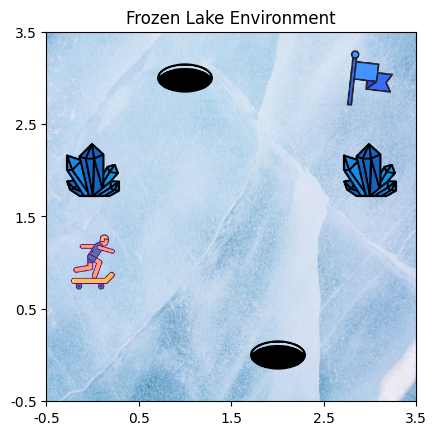

Step 2 - Action: 1, Reward: -0.1
Current State:
[[0.  0.2 0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


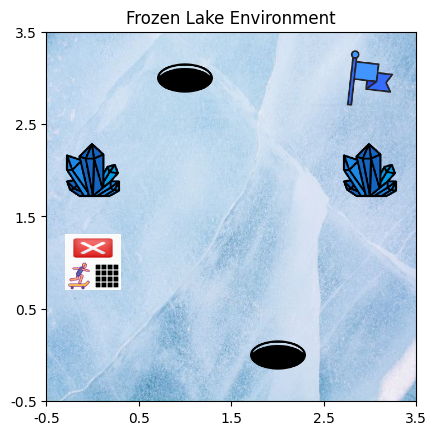

Step 3 - Action: 3, Reward: -1
Current State:
[[0.2 0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


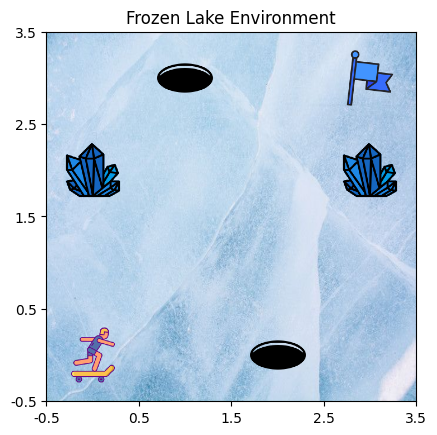

Step 4 - Action: 1, Reward: -0.1
Current State:
[[0.2 0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


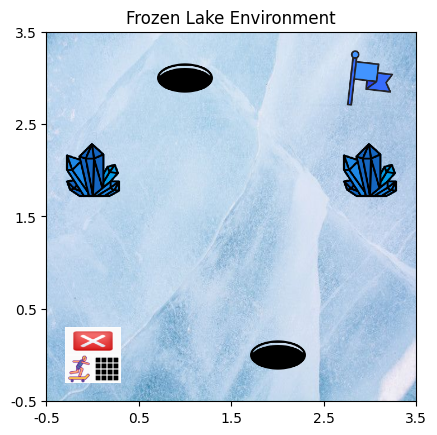

Step 5 - Action: 2, Reward: 1
Current State:
[[0.  0.2 0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


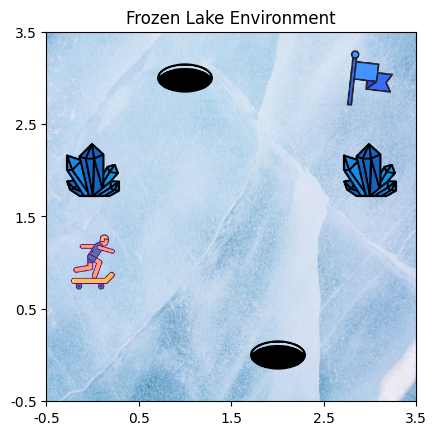

Step 6 - Action: 2, Reward: 5
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


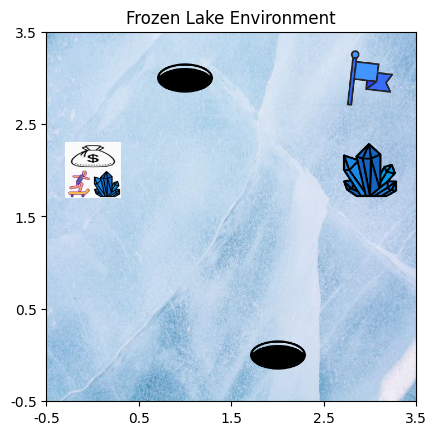

Step 7 - Action: 1, Reward: 5
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


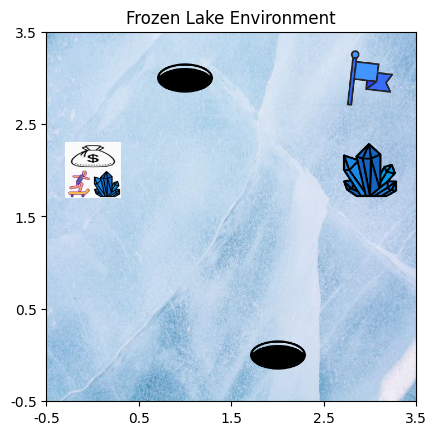

Step 8 - Action: 0, Reward: -0.1
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.2 0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


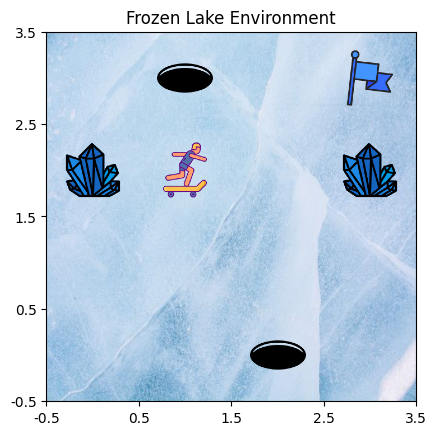

Step 9 - Action: 0, Reward: 1
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.2 0. ]
 [0.  0.  0.5 0.8]]


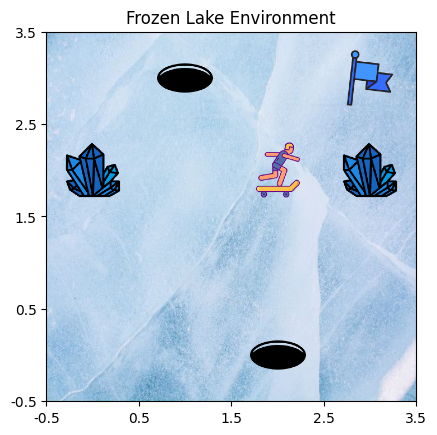

Step 10 - Action: 1, Reward: -1
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.2 0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


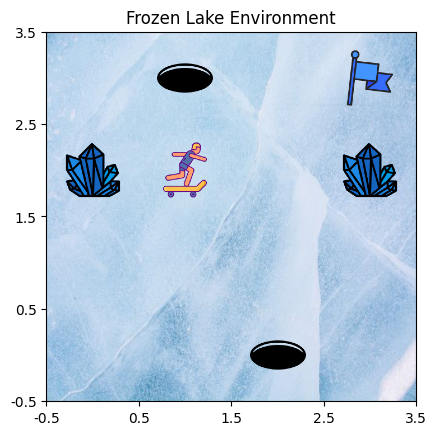

In [11]:
env_det = FrozenLakeEnv()
for _ in range(10):
    action = env_det.action_space.sample()
    obs, reward, terminated, truncated, info = env_det.step(action)
    print(f"Step {_ + 1} - Action: {action}, Reward: {reward}")
    print("Current State:")
    print(env_det.state)
    env_det.render()

    if terminated or truncated:
        env_det.state = np.copy(env_det.prev_state) 
        env_det.myagent = np.argwhere(env_det.state == 0.2)[0]

### 1.2 Stochastic Environment [15 points]

Steps:
1. Define a stochastic environment, where Summation given s′,r (P(s′, r|s, a)) = 1. A modified version of the environment
defined in Part 1.1 should be used.

2. Run a random agent for at least 10 timesteps to show that the environment logic is defined correctly.
Print the current state, chosen action, reward and return your grid world visualization for each step.

In [12]:
class StochasticFrozenLakeEnv(gym.Env):
    metadata = {'render.modes': []}

    def __init__(self, gamma=0.9, alpha=0.1, max_timestamp=10):
        self.gamma = gamma
        self.alpha = alpha
        
        self.obs_space = spaces.Discrete(16)
        self.action_space = spaces.Discrete(4)
        self.max_timestamp = max_timestamp
        self.timestep = 0

        self.state = np.zeros((4, 4))
        self.myskater = np.asarray([0, 0])
        self.goal_loc = np.asarray([3, 3])
        self.gem_loc = [np.asarray([0, 2]), np.asarray([3, 2])]
        self.hole_loc = [np.asarray([1, 3]), np.asarray([2, 0])]

        self.state[tuple(self.myskater)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8
        for pos in self.gem_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hole_loc:
            self.state[tuple(pos)] = 0.4

        self.prev_state = np.zeros((4, 4))
        self.prev_action = None
        self.penalty_counter = 0
        self.flag_out_grid = 0

    def step(self, action):
        self.prev_state = np.copy(self.state)
        self.prev_action = action
        self.flag_out_grid = 0

        randomness = [0.35, 0.15, 0.35, 0.15]  # probability for each action
        action = np.random.choice(4,p=randomness)

        if action == 0:
            self.myskater[0] += 1
        elif action == 1:
            self.myskater[0] -= 1
        elif action == 2:
            self.myskater[1] += 1
        elif action == 3:
            self.myskater[1] -= 1

        self.myskater = np.clip(self.myskater, 0, 3)

        prev_state_positions = np.argwhere(self.prev_state == 0.2)
        if len(prev_state_positions) > 0:
            if np.array_equal(self.myskater, prev_state_positions[0]):
                while action == self.prev_action:
                    action = np.random.choice(4, p=randomness)
                self.flag_out_grid = 1

        self.state = np.zeros((4, 4))
        self.state[tuple(self.myskater)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8
        for pos in self.gem_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hole_loc:
            self.state[tuple(pos)] = 0.4

        obs = self.state.flatten()
        reward = self.calculate_reward()
        penalty = any(np.array_equal(self.myskater, pos) for pos in self.hole_loc)
        if penalty:
            self.penalty_counter += 1
        self.timestep += 1

        terminated = True if np.array_equal(self.myskater, self.goal_loc) else self.timestep >= self.max_timestamp
        truncated = True if np.any((self.myskater < 0) | (self.myskater > 3)) else False
        if terminated or truncated:
            self.flag_out_grid=1
            self.state = np.copy(self.prev_state) 

            # Check if there are any positions with a value of 0.2
            positions_with_value_0_2 = np.argwhere(self.state == 0.2)

            if len(positions_with_value_0_2) > 0:
                # Ensure that the index is within bounds
                index = np.random.randint(len(positions_with_value_0_2))
                self.myagent = positions_with_value_0_2[index]
                
        info = {}

        return self.state.flatten(), reward, terminated, truncated, info
        
    def reset(self, **kwargs):
        self.state = np.zeros((4, 4))
        self.myskater = np.asarray([0, 0])
        self.state[tuple(self.myskater)] = 0.2
        self.state[tuple(self.goal_loc)] = 0.8

        for pos in self.gem_loc:
            self.state[tuple(pos)] = 0.5
        for pos in self.hole_loc:
            self.state[tuple(pos)] = 0.4

        self.prev_state = np.zeros((4, 4))
        self.prev_action = None
        self.flag_out_grid = 0 
        
        obs = self.state.flatten()
        self.timestep = 0
        info = {}
        self.penalty_counter = 0
        return obs, info

    def calculate_reward(self):
        prev_myskateritions = np.argwhere(self.prev_state == 0.2)
        if prev_myskateritions.size == 0:
            prev_myskaterition = self.myskater
        else:
            prev_myskaterition = prev_myskateritions[0]

        # Calculating distance to goal before and after the step
        prev_distance_to_goal = np.linalg.norm(self.goal_loc - prev_myskaterition)
        current_distance_to_goal = np.linalg.norm(self.goal_loc - self.myskater)


        ## REWARDS SET #############
        if np.array_equal(self.myskater, self.goal_loc):
            reward = 10  # Positive reward for reaching goal
        elif np.array_equal(self.myskater, self.hole_loc[0]):
            reward = -5  # negative reward for reaching holes 1
        elif np.array_equal(self.myskater, self.hole_loc[1]):
            reward = -6   # negative reward for reaching holes 2
        elif np.array_equal(self.myskater, self.gem_loc[0]):
            reward = 5   # positive reward for reaching gems 1
        elif np.array_equal(self.myskater, self.gem_loc[1]):
            reward = 6  # positive reward for reaching gems 2
        elif current_distance_to_goal < prev_distance_to_goal:
            reward = 1  # Positive reward for moving closer to goal
        elif current_distance_to_goal > prev_distance_to_goal:
            reward = -1  # Negative reward for moving away to goal
        else:
            reward = -0.1  # Slight negative reward for no change
        ##########################
        
        return reward
    
    def get_penalty_count(self):
        return self.penalty_counter

    def render(self):
        fig, ax = plt.subplots()
        plt.title('Frozen Lake Environment')

        # Load and display the background image
        background_img = plt.imread('images/frozen_lake.jpg')
        ax.imshow(background_img, extent=(-0.5, 3.5, -0.5, 3.5), origin='upper')

       
        skater_img = plt.imread('images/icons8-skateboard-100.png')
        hole_img = plt.imread('images/icons8-hole-100.png')
        gem_img = plt.imread('images/icons8-gems-100.png')
        goal_img = plt.imread('images/icons8-flag-100.png')
        skater_hole_drown_img = plt.imread('images/agent_hole_drown.png')
        skater_gem_lottery_img = plt.imread('images/agent_gems_lottery.png')
        agent_flag_winner_img = plt.imread('images/agent_flag_winner.png')
        agent_grid_cross_img = plt.imread('images/agent_grid_cross.png')

        # Plot Skater
        myskater = self.myskater
        if self.flag_out_grid:
            skater_img = agent_grid_cross_img
        agent_box = AnnotationBbox(OffsetImage(skater_img, zoom=0.4), myskater, frameon=False)
        ax.add_artist(agent_box)

        # Plot Holes
        for hole_loc in self.hole_loc:
            hole_loc = hole_loc
            if np.array_equal(self.myskater, hole_loc):
                hole_img = skater_hole_drown_img
            else:
                hole_img = plt.imread('images/icons8-hole-100.png')
            rock_box = AnnotationBbox(OffsetImage(hole_img, zoom=0.4), hole_loc, frameon=False)
            ax.add_artist(rock_box)

        # Plot Gems
        for gem_loc in self.gem_loc:
            gem_loc = gem_loc
            if np.array_equal(self.myskater, gem_loc):
                gem_img = skater_gem_lottery_img
            else:
                gem_img = plt.imread('images/icons8-gems-100.png')
            battery_box = AnnotationBbox(OffsetImage(gem_img, zoom=0.4), gem_loc, frameon=False)
            ax.add_artist(battery_box)

        # Plot goal
        goal_loc = self.goal_loc
        goal_loc = self.goal_loc
        if np.array_equal(self.myskater, goal_loc):
            goal_img = agent_flag_winner_img
        else:
            goal_img = plt.imread('images/icons8-flag-100.png')
        goal_box = AnnotationBbox(OffsetImage(goal_img, zoom=0.4), goal_loc, frameon=False)
        ax.add_artist(goal_box)

        plt.xticks(np.arange(-0.5, 4.5, 1))
        plt.yticks(np.arange(-0.5, 4.5, 1))
        plt.gca().set_xticklabels(np.arange(-0.5, 4.5, 1))
        plt.gca().set_yticklabels(np.arange(-0.5, 4.5, 1))
        plt.show()

    def obs_space_to_index(self, obs):
        myskater = np.argwhere(obs.reshape(4, 4) == 0.2)
        if myskater.size == 0:
            return 0 
        return myskater[0, 0] * 4 + myskater[0, 1]


Step 1 - Action: 0, Reward: 1
Current State:
[[0.  0.  0.5 0. ]
 [0.2 0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


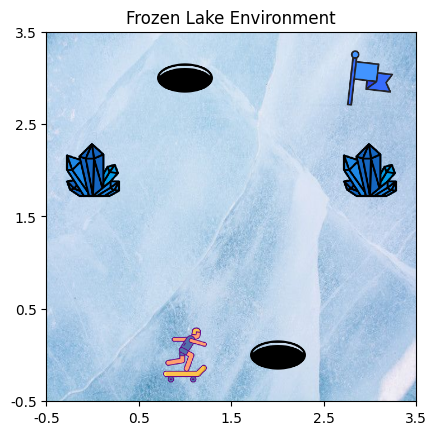

Step 2 - Action: 1, Reward: -6
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


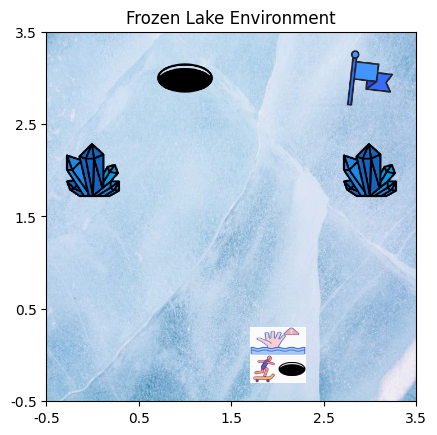

Step 3 - Action: 1, Reward: -6
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.  0.5 0.8]]


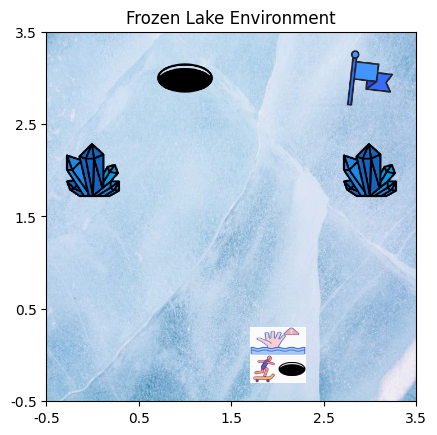

Step 4 - Action: 3, Reward: -0.1
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.2 0.  0.5 0.8]]


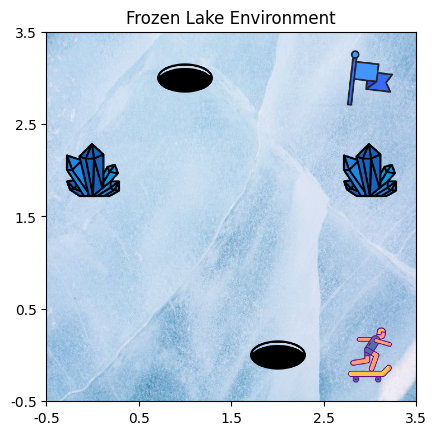

Step 5 - Action: 2, Reward: -0.1
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.2 0.  0.5 0.8]]


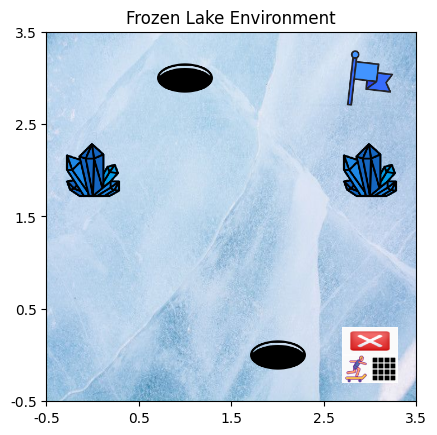

Step 6 - Action: 2, Reward: -0.1
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.2 0.  0.5 0.8]]


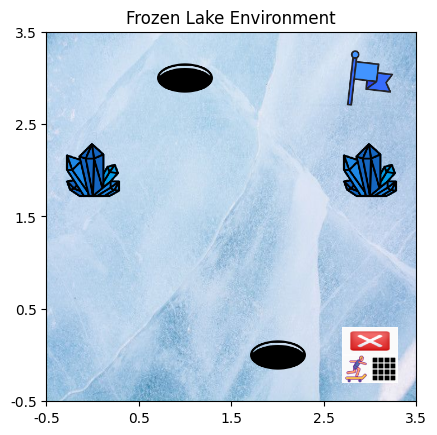

Step 7 - Action: 2, Reward: -0.1
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.2 0.  0.5 0.8]]


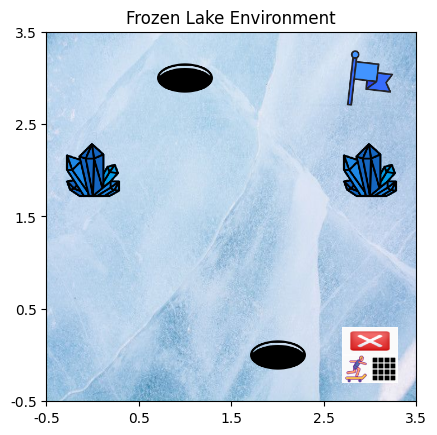

Step 8 - Action: 2, Reward: 1
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.2 0.5 0.8]]


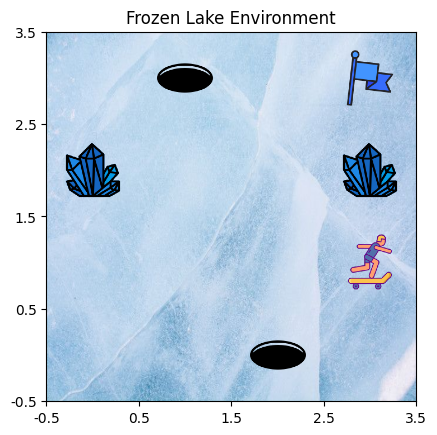

Step 9 - Action: 0, Reward: -0.1
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.2 0.5 0.8]]


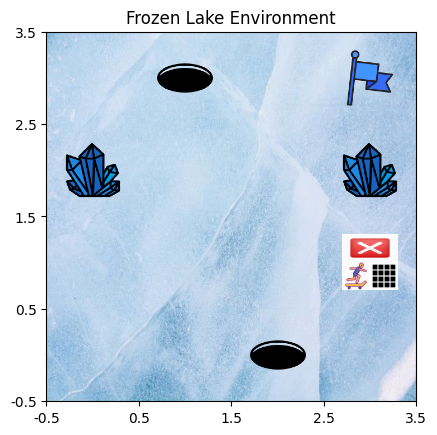

Step 10 - Action: 2, Reward: 6
Current State:
[[0.  0.  0.5 0. ]
 [0.  0.  0.  0.4]
 [0.4 0.  0.  0. ]
 [0.  0.2 0.5 0.8]]


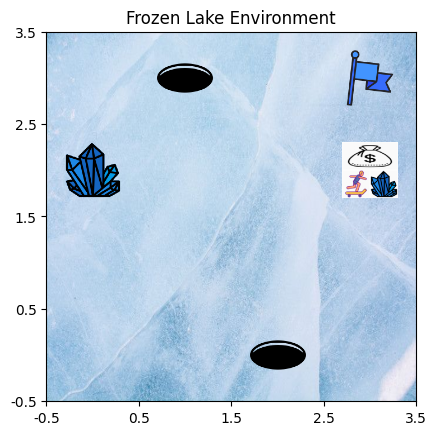

In [13]:
env_stoc = StochasticFrozenLakeEnv()
for _ in range(10):
    action = env_stoc.action_space.sample()
    obs, reward, terminated, truncated, info = env_stoc.step(action)
    print(f"Step {_ + 1} - Action: {action}, Reward: {reward}")
    print("Current State:")
    print(env_stoc.state)
    env_stoc.render()

    if terminated or truncated:
        env_stoc.state = np.copy(env_stoc.prev_state) 

        positions_with_value_0_2 = np.argwhere(env_stoc.state == 0.2)

        if len(positions_with_value_0_2) > 0:
            index = np.random.randint(len(positions_with_value_0_2))
            env_stoc.myagent = positions_with_value_0_2[index]
        else:
            env_stoc.myagent = (0, 0)


## Part 2 [Total: 40 points] - Applying Tabular Methods

### 2.1 Q-learning

Apply Q-learning to solve both the deterministic and stochastic environments that were defined in
Part 1.

#### Deterministic Q Learning

In [14]:
env_det = FrozenLakeEnv()

epsilon = 1.0  # Initial exploration rate
epsilon_min = 0.01  # Minimum exploration rate
gamma = 0.95  # Discount factor
alpha = 0.15  # Learning rate
decay_rate = 0.995  # Epsilon decay rate per episode
total_episodes = 1000 
max_timestamp = 10
qt = np.zeros((env_det.obs_space.n, env_det.action_space.n))

rewards_epi = []
epsilon_values = []
steps_per_episode = []
penalties_per_episode = []

final_state = None
for episode in range(total_episodes):
    state, _ = env_det.reset()
    state_index = env_det.obs_space_to_index(state)
    total_rewards = 0
    total_steps = 0  
    action = env_det.action_space.sample() if np.random.uniform(0, 1) < epsilon else np.argmax(qt[state_index])

    while True:
        next_state, reward, terminated, truncated, _ = env_det.step(action)
        total_steps += 1 
        next_strt_idx = env_det.obs_space_to_index(next_state)
        next_action = env_det.action_space.sample() if np.random.uniform(0, 1) < epsilon else np.argmax(qt[next_strt_idx])
        qt[state_index, action] = qt[state_index, action] + alpha * (reward + gamma * qt[next_strt_idx, next_action] - qt[state_index, action])
        state_index, action = next_strt_idx, next_action
        total_rewards += reward
        
        if terminated or truncated:
            break
    
    penalties_per_episode.append(env_det.get_penalty_count())  
    
    # Q-table for every 100 episodes
    if (episode + 1) % 100 == 0:
        print(f"Episode: {episode + 1}")
        print("Q-table:")
        print(qt)
        avg_penalty = np.mean(penalties_per_episode[-100:])
        print(f"Average Penalties in Last 100 Episodes: {avg_penalty}")

    epsilon = max(epsilon_min, epsilon * decay_rate)
    epsilon_values.append(epsilon)
    rewards_epi.append(total_rewards)
    steps_per_episode.append(total_steps)

    if (episode + 1) % 100 == 0:
        average_steps = np.mean(steps_per_episode[-100:])
        print(f"Episode: {episode + 1}, Average Steps: {average_steps}")

    if episode == total_episodes - 1:
        final_state = env_det.state


Episode: 100
Q-table:
[[ 3.10648666  4.61299824  4.13973199  2.10028339]
 [ 1.92207972  4.94787519  8.15964293  1.21669008]
 [ 0.          0.          0.          0.        ]
 [-1.92428237  1.61712652  1.17849108  7.82450325]
 [-3.10741614  1.36101753  2.75015885 -0.63251942]
 [-0.07797719  1.03284626  3.95528461 -0.36304485]
 [ 3.49777758  7.84270131 -2.24732666 -0.02250756]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.76823131 -0.71648749  1.82546785 -2.79002711]
 [ 6.55029426  0.86675505  0.71147621 -0.07546828]
 [ 2.87540553 -1.00471004 -0.08041554 -0.38866311]
 [-0.3820484  -1.96373669  0.7634541  -0.06166288]
 [ 0.11553445  0.          4.17818817 -0.36735704]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]]
Average Penalties in Last 100 Episodes: 0.77
Episode: 100, Average Steps: 9.9
Episode: 200
Q-table:
[[ 6.48764087 12.11823442  9.258471    7.24949556]
 [ 5.15228

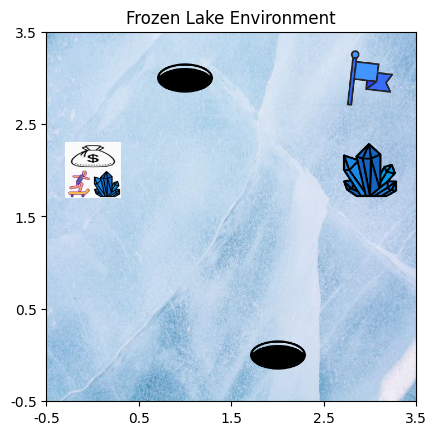

In [15]:
env_det.state = final_state
env_det.render()

Step 2:
Save the Q-table/Policy table as a pickle file or h5 of the trained model and attach it to your assignment submission.

In [16]:
import pickle
with open("models/charviku_assignment1_q_table_deterministic.pkl", 'wb') as file:
    pickle.dump(qt, file)

Step 3:

Provide the evaluation results:

(a) Print the initial Q-table and the trained Q-table

(b) Plot the total reward per episode graph (x-axis: episode, y-axis: total reward per episode).

(c) Plot the epsilon decay graph (x-axis: episode, y-axis: epsilon value)

(d) Run your environment for at least 10 episodes, where the agent chooses only greedy actions from the learned policy. Include a plot of the total reward per episode.

In [17]:
initial_qt = np.zeros((env_det.obs_space.n, env_det.action_space.n))
print("Initial Q-table:")
print(initial_qt)

Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


In [18]:
print("Trained Q-table:")
print(qt)

Trained Q-table:
[[ 3.68329767e+01  3.87741823e+01  4.66184840e+01  3.98446547e+01]
 [ 2.28215937e+01  3.71445017e+01  4.88189573e+01  3.11370305e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 3.32762404e+01  4.11609301e+01  4.38693221e+01  4.91931451e+01]
 [ 4.31582113e+00  4.59745806e+00  2.11824712e+01  4.57564788e+00]
 [ 2.78881500e+00  3.68367830e+01  1.43476062e+01  5.39656838e-02]
 [ 7.04769941e+00  4.59877443e+01  3.79664344e+00  3.99278778e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.39838843e+00  9.70843800e-01  9.34725843e+00  5.01036304e-01]
 [ 1.98704885e+01  1.60745776e+00  1.61218199e+00  4.59373035e-02]
 [ 8.32729135e+00 -5.14620474e-01 -8.04155431e-02 -3.88663108e-01]
 [-3.82048398e-01 -1.96373669e+00  7.63454099e-01 -6.16628845e-02]
 [ 1.15534453e-01  0.00000000e+00  6.55430097e+00 -3.67357036e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000

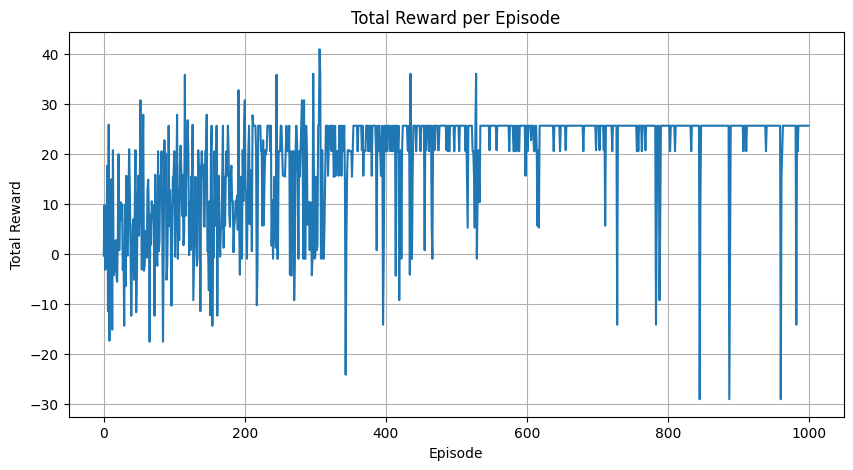

In [19]:
# total reward per episode graph
plt.figure(figsize=(10, 5))
plt.plot(rewards_epi)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Total Reward per Episode')
plt.grid(True)
plt.show()


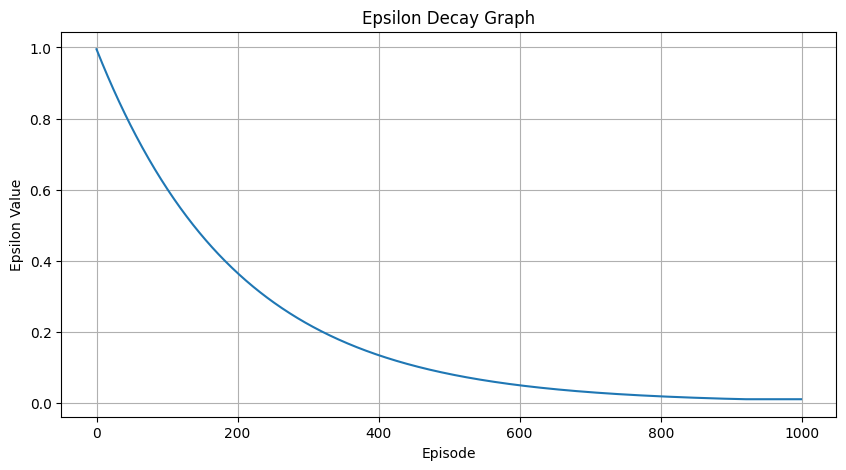

In [20]:
# epsilon decay graph
plt.figure(figsize=(10, 5))
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.title('Epsilon Decay Graph')
plt.grid(True)
plt.show()

Episode 1000 Reward: 25.6
Episode 1000 Reward: 25.6
Episode 1000 Reward: 25.6
Episode 1000 Reward: 25.6
Episode 1000 Reward: 25.6
Episode 1000 Reward: 25.6
Episode 1000 Reward: 25.6
Episode 1000 Reward: 25.6
Episode 1000 Reward: 25.6
Episode 1000 Reward: 25.6


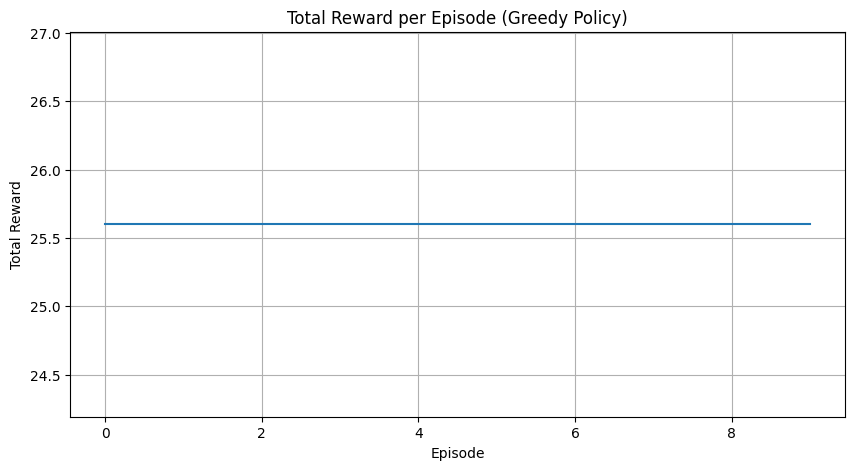

In [21]:
greedy_rewards = []
for _ in range(10):
    total_reward = 0
    state, _ = env_det.reset()
    state_index = env_det.obs_space_to_index(state)

    while True:
        action = np.argmax(qt[state_index])
        next_state, reward, terminated, truncated, _ = env_det.step(action)
        next_strt_idx = env_det.obs_space_to_index(next_state)
        total_reward += reward
        state_index = next_strt_idx
        if terminated or truncated:
            print(f"Episode {episode + 1} Reward: {round(total_reward, 4)}")
            break

    greedy_rewards.append(total_reward)

# total rewards for 10 episodes
plt.figure(figsize=(10, 5))
plt.plot(greedy_rewards)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Total Reward per Episode (Greedy Policy)')
plt.grid(True)
plt.show()

Step 4. Hyperparameter Tuning: Select at least two hyperparameters to tune to get better results for Q-learning.
You can explore hyperparameter tuning libraries, e.g. Optuna or make it manually. Parameters to
tune (select 2):

• Discount factor (γ)

• Epsilon decay rate

• Epsilon min/max values

• Number of episodes

• Max timesteps

Try at least 3 different values for each of the parameters that you choose

In [22]:
performance_dict = {}

def training_loop(env, g , max_timestamp):
    alpha = 0.15  # Learning rate
    gamma = g  # Discount factor
    epsilon = 1.0  # Initial exploration rate
    epsilon_min = 0.01  # Minimum exploration rate
    decay_rate = 0.995  # Epsilon decay rate per episode
    total_episodes = 1000
    max_timestamp = max_timestamp

    qt = np.zeros((env.obs_space.n, env.action_space.n))

    rewards_epi = []
    epsilon_values = []
    steps_per_episode = []
    penalties_per_episode = []

    final_state = None
    for episode in range(total_episodes):
        state, _ = env.reset()
        state_index = env.obs_space_to_index(state)
        total_rewards = 0
        total_steps = 0 
        action = env.action_space.sample() if np.random.uniform(0, 1) < epsilon else np.argmax(qt[state_index])

        while True:
            next_state, reward, terminated, truncated, _ = env.step(action)
            total_steps += 1 
            next_strt_idx = env.obs_space_to_index(next_state)
            next_action = env.action_space.sample() if np.random.uniform(0, 1) < epsilon else np.argmax(qt[next_strt_idx])
            qt[state_index, action] = qt[state_index, action] + alpha * (reward + gamma * qt[next_strt_idx, next_action] - qt[state_index, action])
            state_index, action = next_strt_idx, next_action
            total_rewards += reward
            
            if terminated or truncated:
                break
        
        penalties_per_episode.append(env.get_penalty_count())              
        epsilon = max(epsilon_min, epsilon * decay_rate)
        epsilon_values.append(epsilon)
        rewards_epi.append(total_rewards)
        steps_per_episode.append(total_steps)

        if episode == total_episodes - 1:
            final_state = env.state
        
    final_reward = np.mean(rewards_epi[-100:]) 
    performance_dict[(alpha, gamma, max_timestamp)] = final_reward
    return qt, rewards_epi, epsilon_values, final_state
        


In [23]:
def evaluate_loop(env, max_timestamp, gamma, qt, rewards_epi, epsilon_values, final_state):
    print(f"Max Timestamp, Gamma:  {max_timestamp}, {gamma}")

    initial_qt = np.zeros((env.obs_space.n, env.action_space.n))
    print("Initial Q-table:")
    print(initial_qt)
    print("\nTrained Q-table:")
    print(qt)


    plt.figure(figsize=(10, 5))
    plt.plot(rewards_epi)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Total Reward per Episode')
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(epsilon_values)
    plt.xlabel('Episode')
    plt.ylabel('Epsilon Value')
    plt.title('Epsilon Decay Graph')
    plt.grid(True)
    plt.show()

    greedy_rewards = []
    for _ in range(10):
        total_reward = 0
        state, _ = env.reset()
        state_index = env.obs_space_to_index(state)

        while True:
            action = np.argmax(qt[state_index])
            next_state, reward, terminated, truncated, _ = env.step(action)
            next_strt_idx = env.obs_space_to_index(next_state)
            total_reward += reward
            state_index = next_strt_idx

            if terminated or truncated:
                print(f"Episode {episode + 1} Reward: {round(total_reward, 4)}")
                break

        greedy_rewards.append(total_reward)

    plt.figure(figsize=(10, 5))
    plt.plot(greedy_rewards)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Total Reward per Episode (Greedy Policy)')
    plt.grid(True)
    plt.show()

    env.state = final_state
    env.render()   

Step 5.

Provide the evaluation results (refer to Step 3) and your explanation for each result for each hyperparameter.
In total, you should complete Step 3 seven times [Base model (step 1) + Hyperparameter #1
x 3 difference values & Hyperparameter #2 x 3 difference values]. Make your suggestion on the most
efficient hyperparameters values for your problem setup.

Max Timestamp, Gamma:  12, 0.1
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 5.05364997e-01  4.18225739e-01 -1.23066120e-01  2.88063056e-01]
 [ 1.13265788e+00  2.57044629e-01  5.05961148e+00 -8.84981838e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.91362537e+00  3.19492423e-01  3.59818066e-01  5.05811714e+00]
 [-5.89109048e+00 -9.18510508e-01  1.15056482e+00 -8.49145644e-03]
 [ 1.10560486e+00 -5.23342747e-01  1.50548172e+00 -9.88351295e-01]
 [ 1.60345263e+00  5.05401440e+00 -4.93791148e+00 -8.56341947e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.39449577e+00 -8.59682407e-01  8.76830997e-01 -4.33302857e+00]
 [ 6.07458849e+00 -7.97

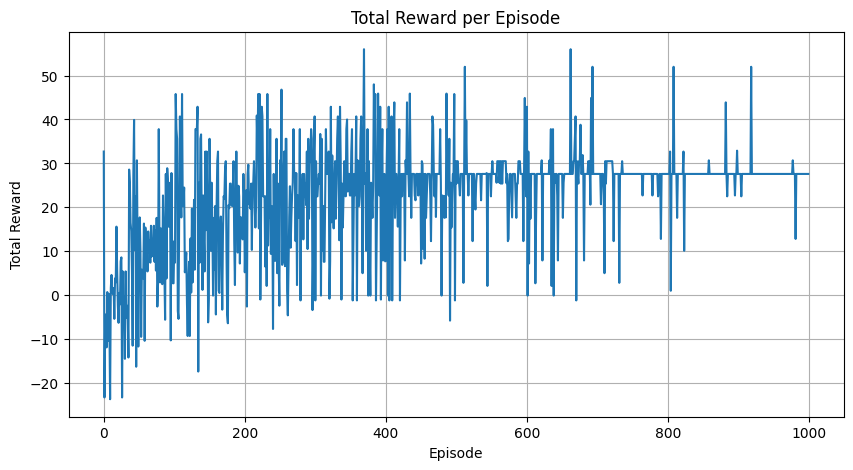

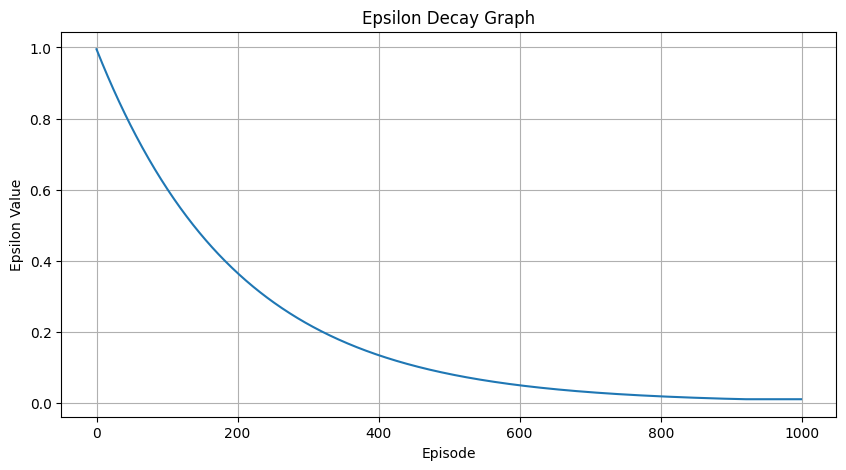

Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6


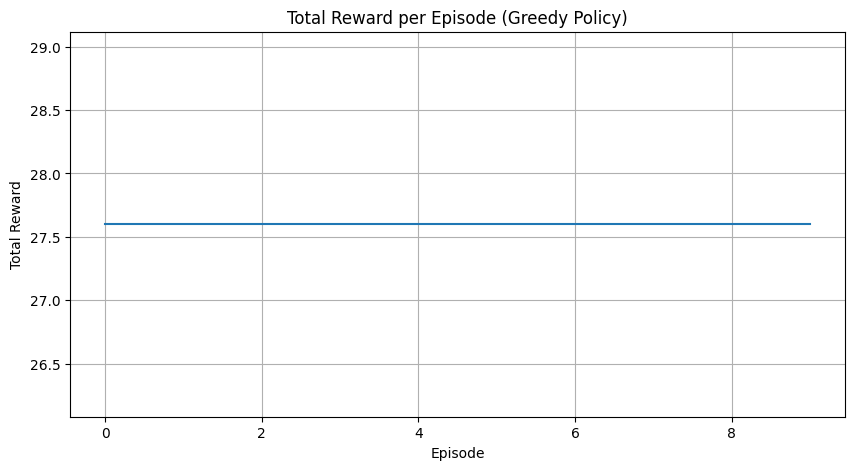

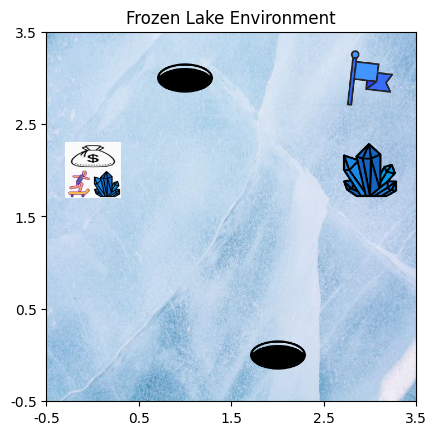

Max Timestamp, Gamma:  12, 0.5
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 3.07406042  2.71181426  0.90479719  2.13778024]
 [ 2.35538557  2.7501176   6.71994856  0.55458359]
 [ 0.          0.          0.          0.        ]
 [-3.78016726  3.09046774  2.9573407   6.53392725]
 [-4.92256391  0.20058263  3.12094991  1.19911207]
 [ 2.62428307  1.83747267  4.24826827  0.16626168]
 [ 4.67624956  6.5217038  -3.71426237  1.07870881]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 1.9479385  -0.14352514  4.18133803 -4.58595267]
 [ 7.50934664 -1.2495176   4.37905947 -0.09603302]
 [11.46997079 -1.738436    0.19153332  0.16990152]
 [-0.03611564 -4.00742533  3.04960373 -0.5046547 ]
 [ 0.82187462 -0.67431142  7.0

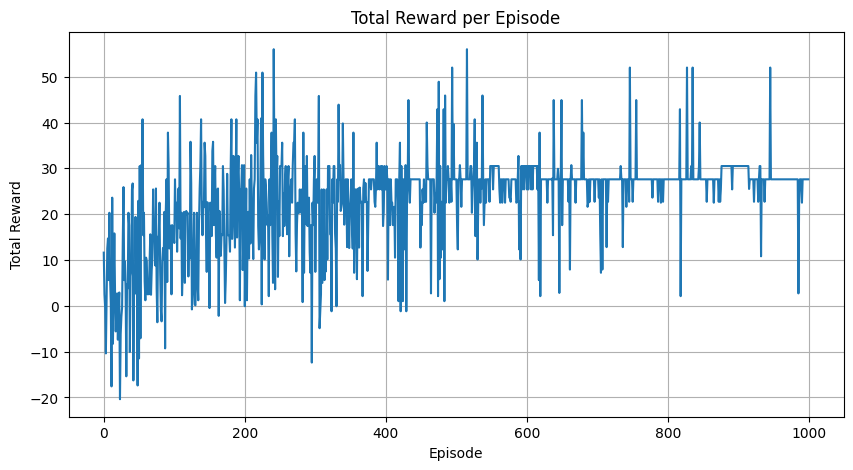

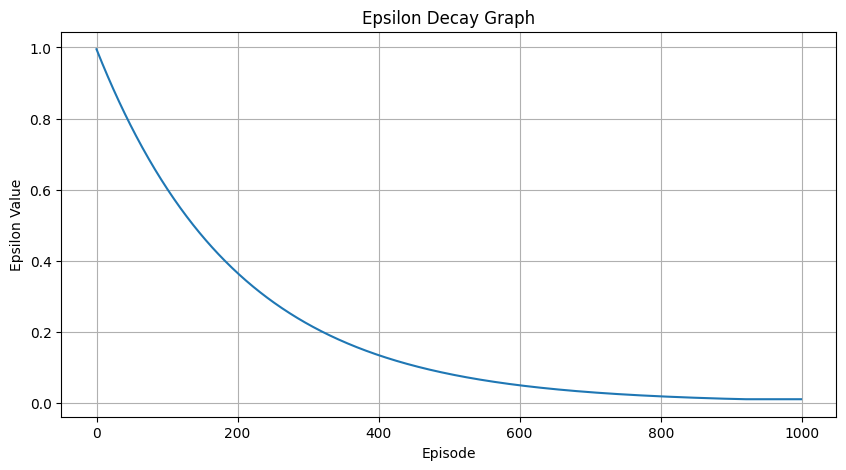

Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6
Episode 1000 Reward: 27.6


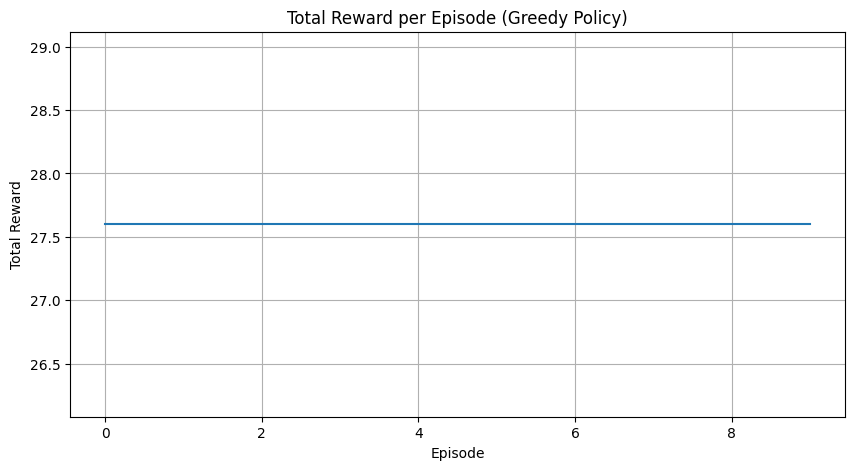

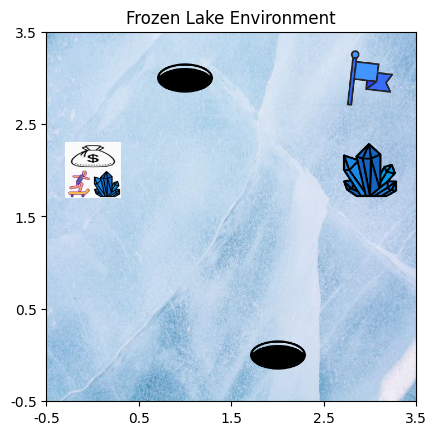

Max Timestamp, Gamma:  12, 0.9
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 1.75923966e+01  1.79396338e+01  1.94705929e+01  1.55209092e+01]
 [ 9.83648604e+00  1.60900745e+01  2.44559373e+01  1.33758744e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.20290469e+01  1.84710718e+01  2.07505642e+01  2.55453468e+01]
 [ 6.58258824e+00  9.31683080e+00  2.12532733e+01  1.09841652e+01]
 [ 8.45751960e+00  1.52963615e+01  2.26649267e+01  6.06762572e+00]
 [ 1.95408433e+01  2.42068561e+01  1.19290308e+01  1.69609358e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 9.67090804e-01  2.60356260e+00  1.58977576e+01  6.49633077e-01]
 [ 2.35766039e+01  5.34

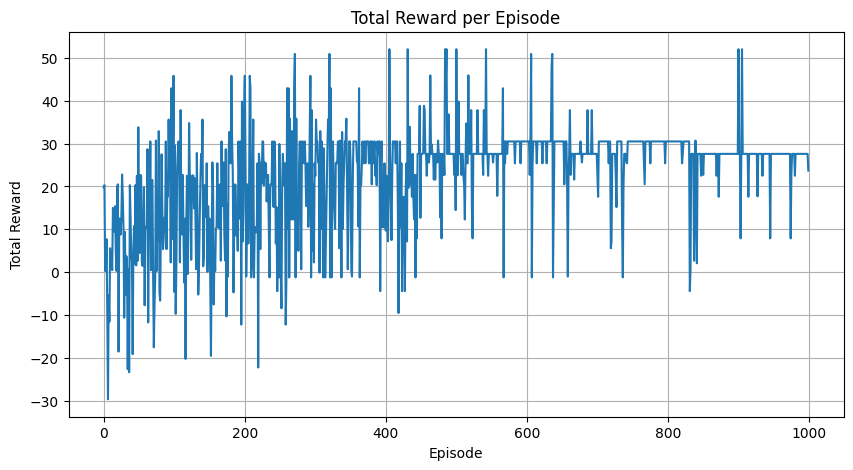

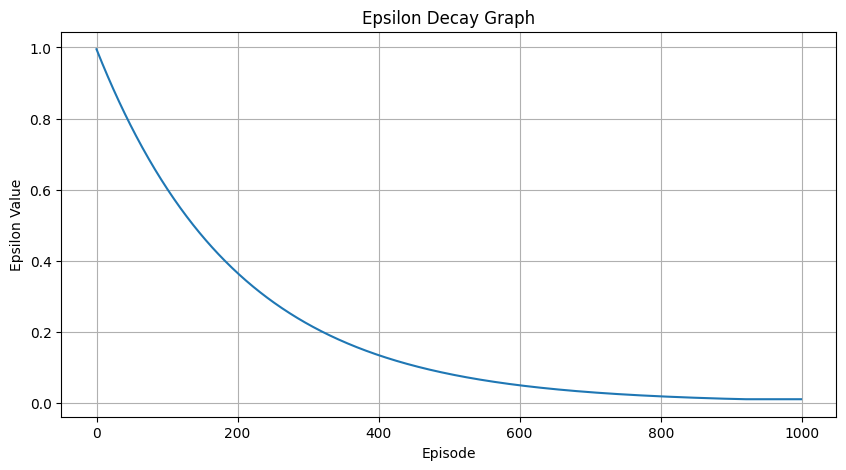

Episode 1000 Reward: 30.5
Episode 1000 Reward: 30.5
Episode 1000 Reward: 30.5
Episode 1000 Reward: 30.5
Episode 1000 Reward: 30.5
Episode 1000 Reward: 30.5
Episode 1000 Reward: 30.5
Episode 1000 Reward: 30.5
Episode 1000 Reward: 30.5
Episode 1000 Reward: 30.5


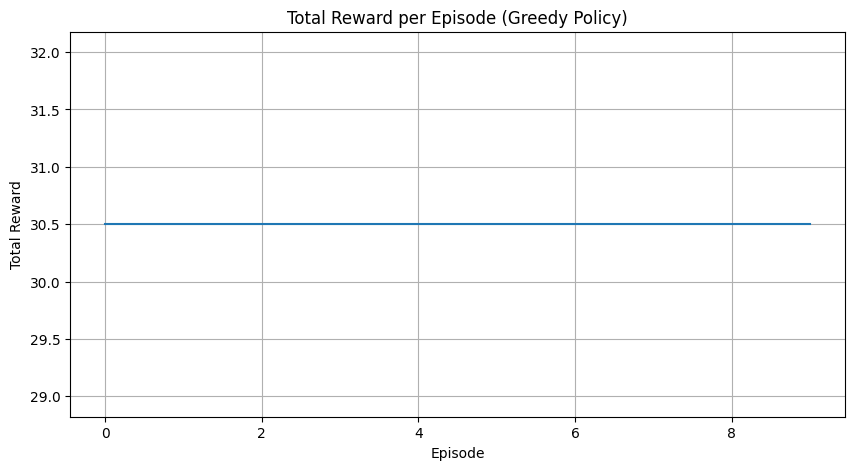

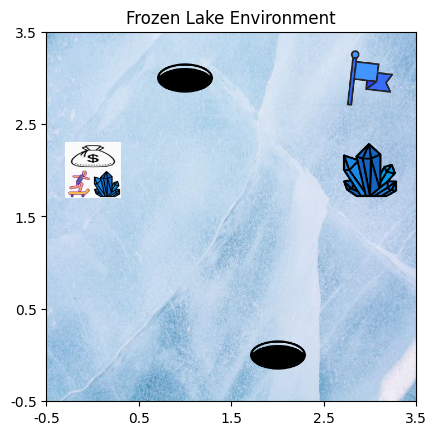

Max Timestamp, Gamma:  15, 0.1
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 4.64238747e-01  2.94388630e-01 -8.80667553e-01  1.97222516e-01]
 [ 1.09749523e+00  2.92694792e-01  5.06009364e+00 -8.70396484e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.91540961e+00  3.61841120e-01  2.51587663e-01  5.05324129e+00]
 [-5.90388904e+00 -8.54673333e-01  1.15051224e+00  6.34483179e-03]
 [ 1.11927243e+00 -5.23768521e-01  1.50506169e+00 -9.23725787e-01]
 [ 1.54295015e+00  5.05056261e+00 -4.95428947e+00 -8.50786335e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 9.59087121e-01 -8.15897245e-01  1.57281026e+00 -3.68371397e+00]
 [ 6.06377951e+00 -7.35

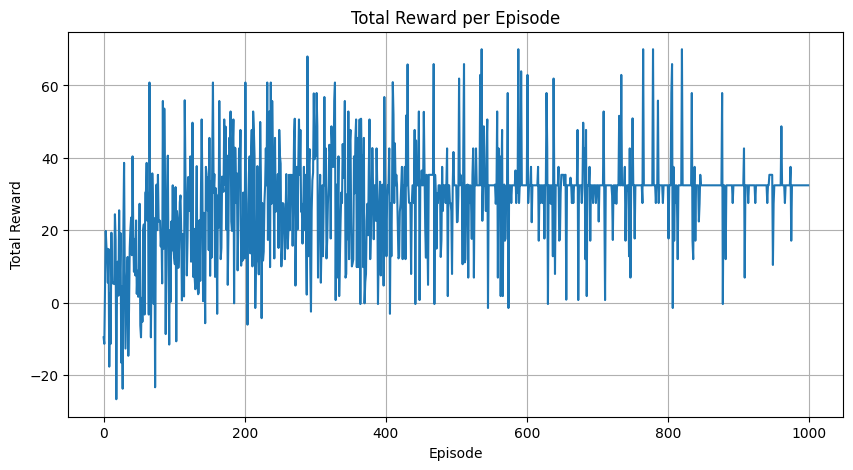

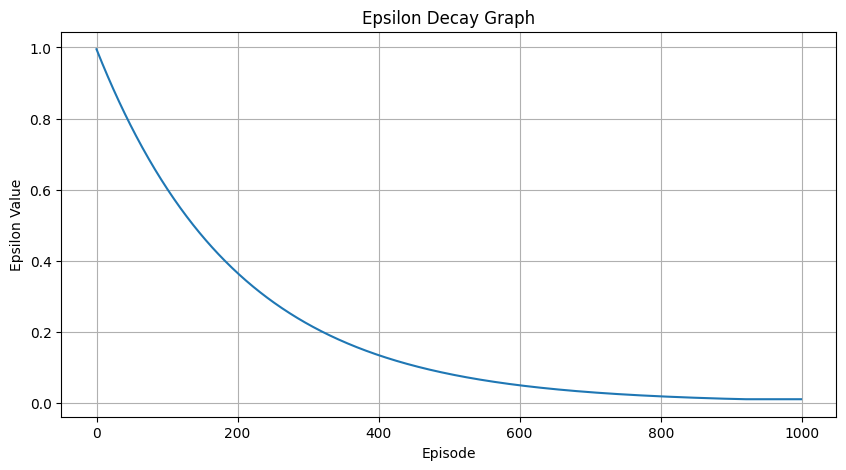

Episode 1000 Reward: 32.4
Episode 1000 Reward: 32.4
Episode 1000 Reward: 32.4
Episode 1000 Reward: 32.4
Episode 1000 Reward: 32.4
Episode 1000 Reward: 32.4
Episode 1000 Reward: 32.4
Episode 1000 Reward: 32.4
Episode 1000 Reward: 32.4
Episode 1000 Reward: 32.4


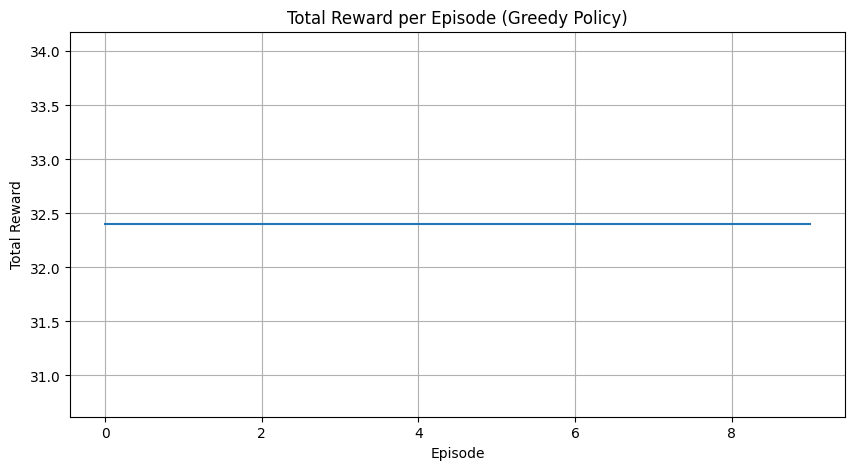

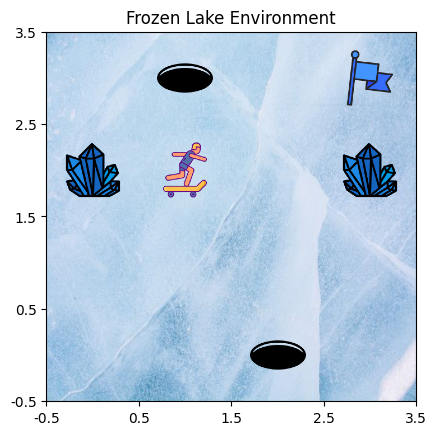

Max Timestamp, Gamma:  15, 0.5
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 2.74732766  2.4433868   3.31654269  2.13054441]
 [ 2.69300769  2.29217045  6.73058901  0.45264789]
 [ 0.          0.          0.          0.        ]
 [-3.64784872  2.7989419   3.06839845  6.68280448]
 [-4.8840302   0.28750149  3.13537736  1.11042587]
 [ 2.09929572  1.168832    4.26770488  0.21336438]
 [ 4.81018096  6.54105541 -3.62036359  1.07653458]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 2.34313646 -0.59957894  4.49447807 -4.00050892]
 [ 7.67656762  1.29510759  4.6286413   0.08408177]
 [11.57134366 -2.66478161  1.25373069  0.74632399]
 [-0.26151843 -4.52160717  3.94503232 -0.32583585]
 [ 0.28398791 -0.55379566  7.6

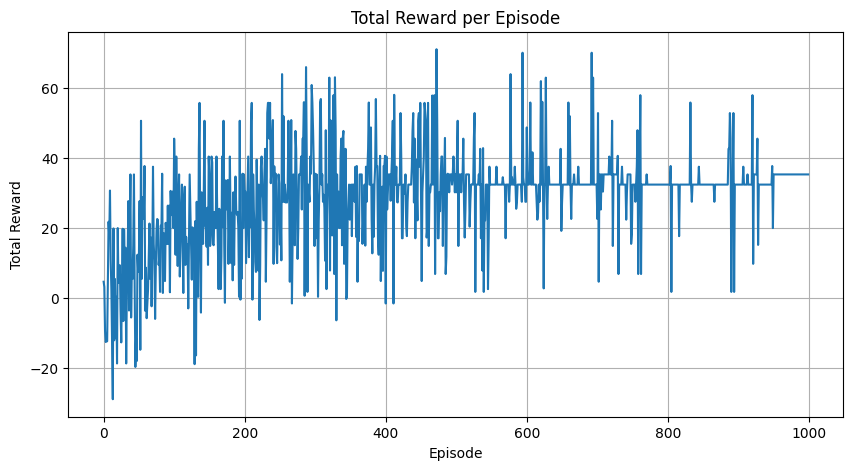

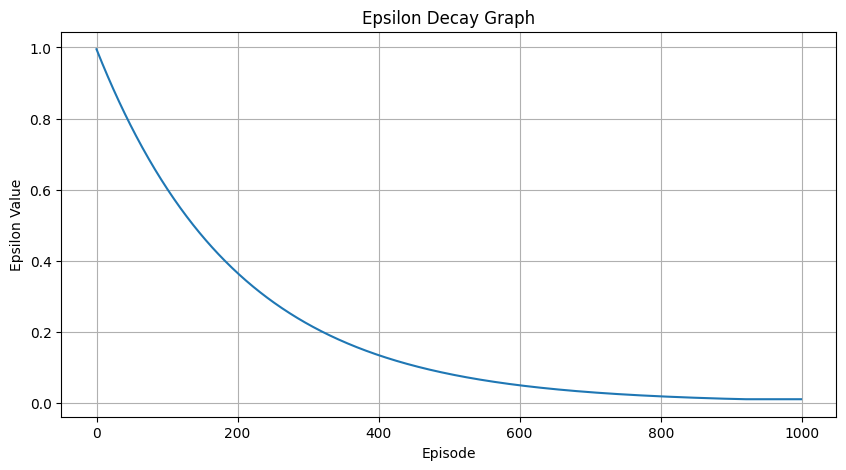

Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3


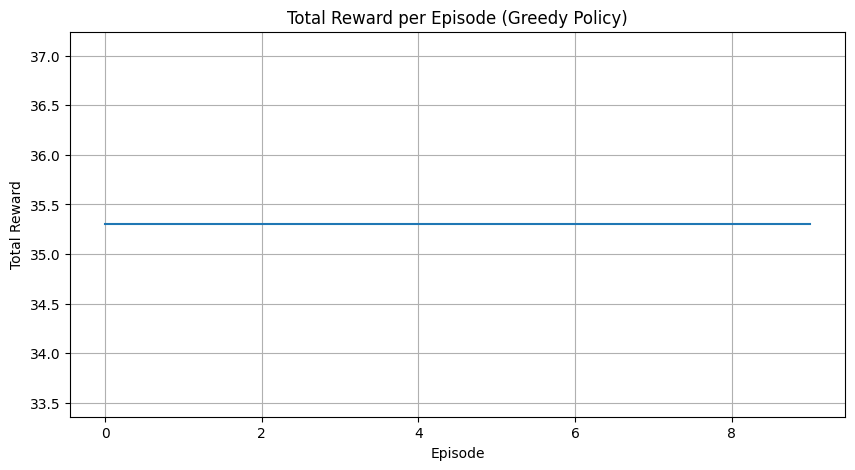

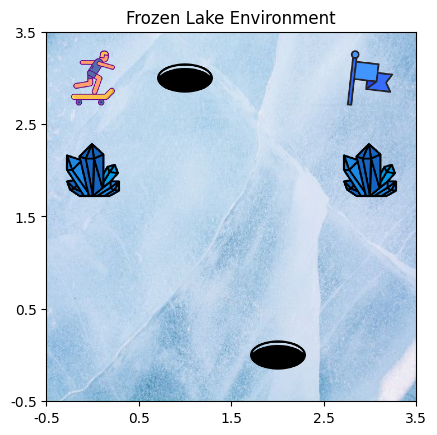

Max Timestamp, Gamma:  15, 0.9
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 1.80064182e+01  2.14784252e+01  2.31237926e+01  2.05776010e+01]
 [ 1.69811501e+01  1.99149782e+01  2.61007210e+01  1.57625932e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.37905467e+01  2.12823937e+01  2.08398227e+01  2.58799695e+01]
 [ 7.81914233e+00  1.36068835e+01  2.16145231e+01  7.56123771e+00]
 [ 9.50261344e+00  1.50648254e+01  2.28673792e+01  6.65273577e+00]
 [ 1.97975062e+01  2.42776418e+01  1.07337317e+01  1.72265947e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 2.91994956e+00  1.85856594e+00  1.80482887e+01  2.00107559e-03]
 [ 2.38225038e+01  9.13

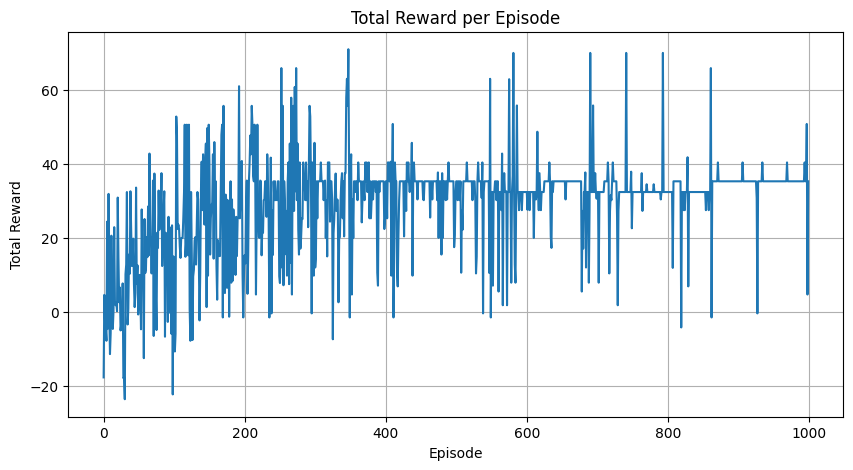

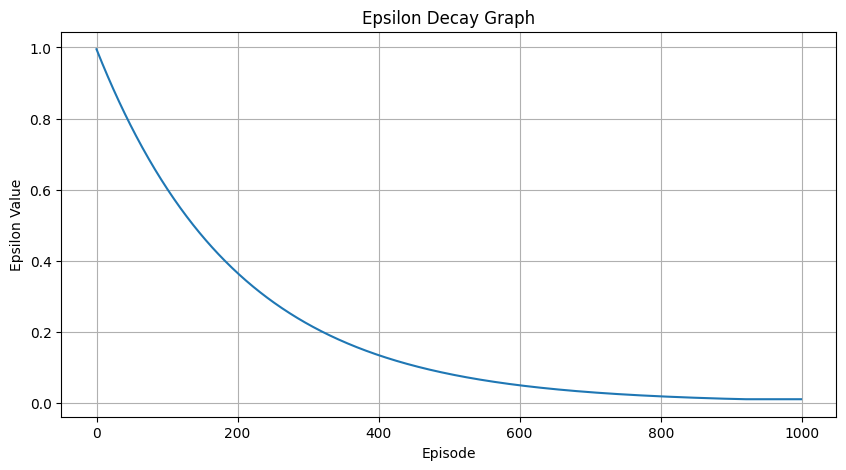

Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3
Episode 1000 Reward: 35.3


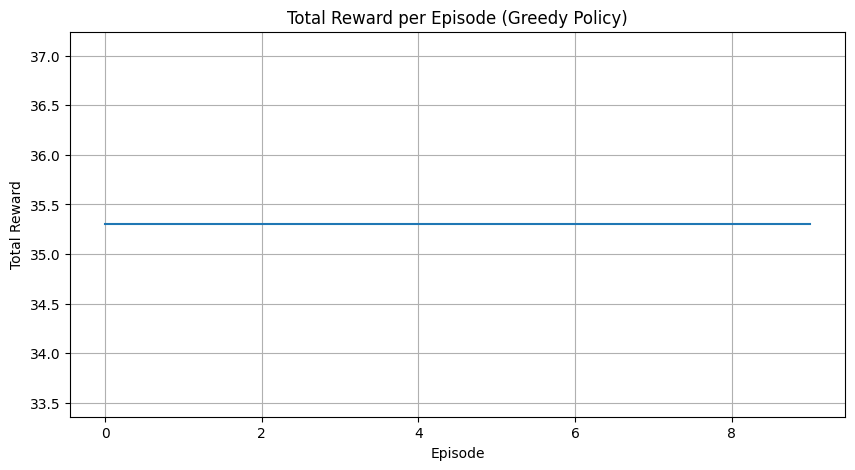

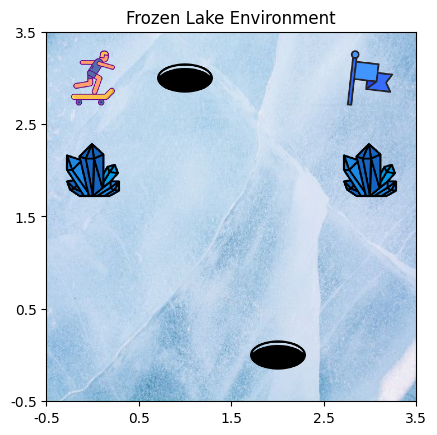

Max Timestamp, Gamma:  20, 0.1
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 4.30572066e-01  1.65022965e-01 -1.70447287e-02  1.89557981e-01]
 [ 1.05330762e+00  3.42231770e-01  5.06410883e+00 -7.75064963e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.93357532e+00  3.98823686e-01  3.12342658e-01  5.04922966e+00]
 [-5.85409907e+00 -8.22313785e-01  1.15041155e+00 -7.73552633e-03]
 [ 1.11807726e+00 -5.82140273e-01  1.50612685e+00 -9.02312825e-01]
 [ 1.60604027e+00  5.04579695e+00 -4.94471525e+00 -8.55699855e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.56452850e+00 -8.63425881e-01  1.32443929e+00 -5.46374564e+00]
 [ 6.05244548e+00 -7.18

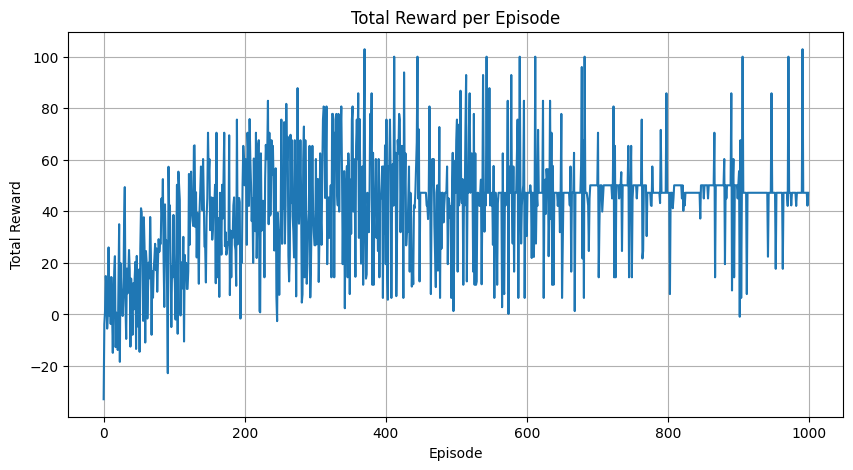

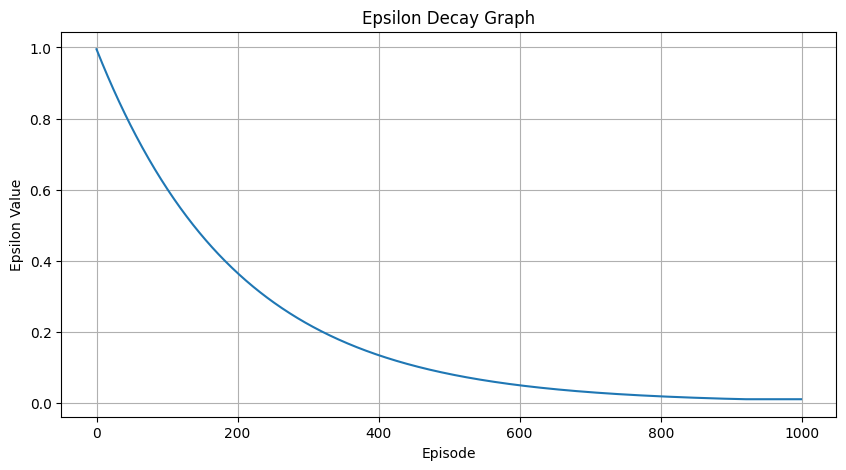

Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2


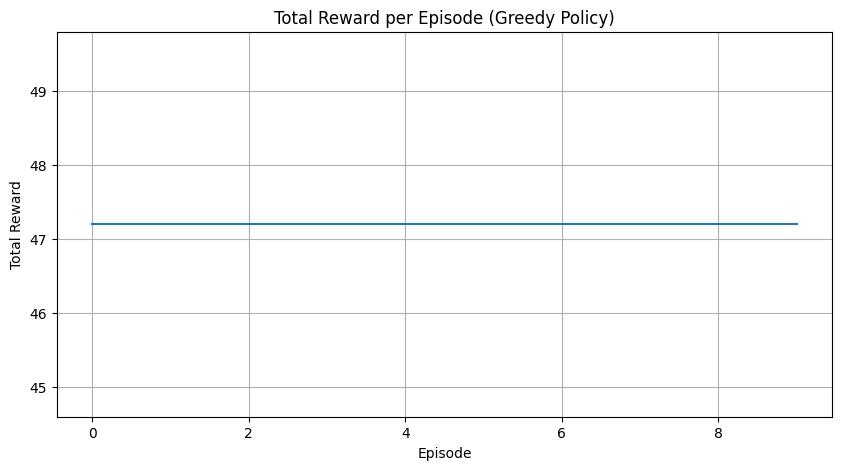

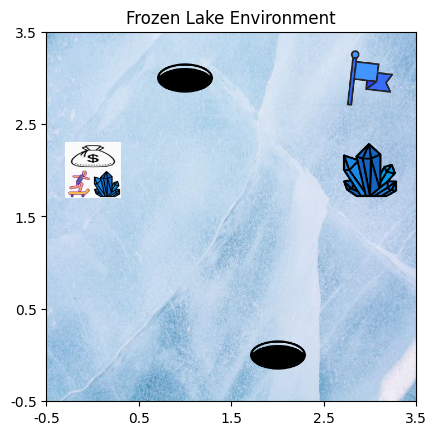

Max Timestamp, Gamma:  20, 0.5
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 3.14497391  2.74873415  2.33165355  2.14026   ]
 [ 2.78012278  3.21100522  6.64223235  0.5039018 ]
 [ 0.          0.          0.          0.        ]
 [-3.54840929  3.16502195  3.19459688  6.53664527]
 [-4.40152739  0.62978999  3.13938006  1.09895947]
 [ 2.94105014  1.99375739  4.27982866  0.15294606]
 [ 4.9386981   6.5601307  -3.48184161  1.05049613]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 3.29735381 -0.5496106   4.68490801 -4.94648903]
 [ 7.77780265  1.50998521  5.52042377  0.1444989 ]
 [11.88675817 -3.55099073  2.79878702  0.44363555]
 [ 0.29137739 -4.51477854  3.97262734 -0.33900237]
 [ 1.52458276 -0.02311522  8.2

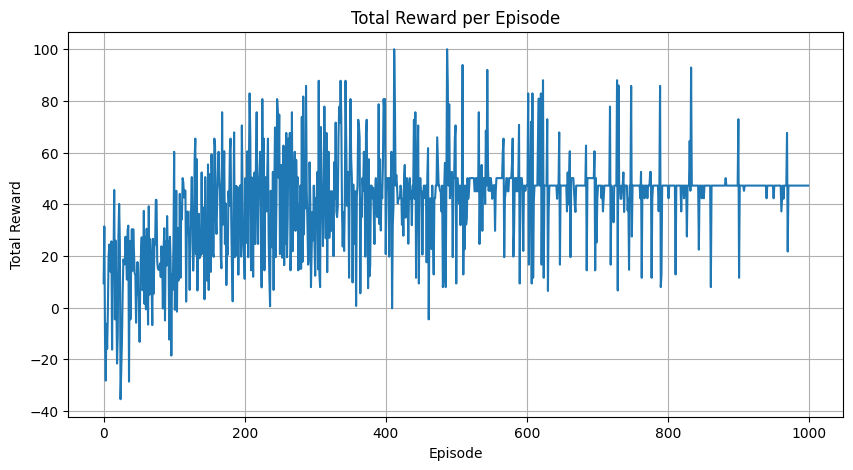

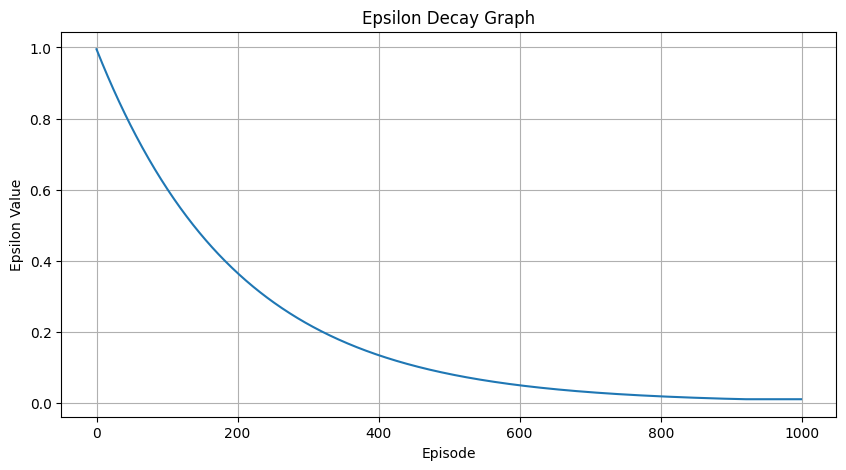

Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2
Episode 1000 Reward: 47.2


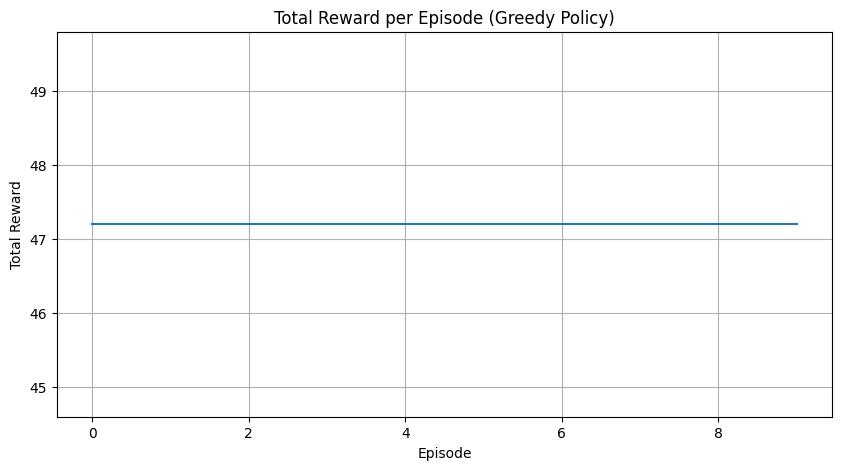

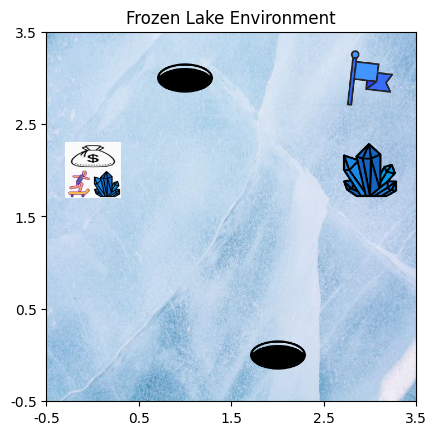

Max Timestamp, Gamma:  20, 0.9
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[50.59733924 42.71780504 45.40700936 40.62052367]
 [16.51734452 18.38503402 34.46123045 15.05878782]
 [ 0.          0.          0.          0.        ]
 [12.32581466 19.82740894 20.66555227 23.93642426]
 [17.04111437 23.54640403 37.68591442 23.52445016]
 [10.92134457 19.26758912 40.98941561 11.15511195]
 [44.67911147 29.66908031 22.82443593 23.17380055]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [25.65008552  3.52219094  6.97314332 -0.11256169]
 [48.937755   21.7615257   8.94929418  6.61672252]
 [36.98277408  1.00407672  4.28438143  0.41484137]
 [ 2.35632799 -1.80303167 23.24113308  0.3355644 ]
 [ 5.57697618  3.76673846 47.9

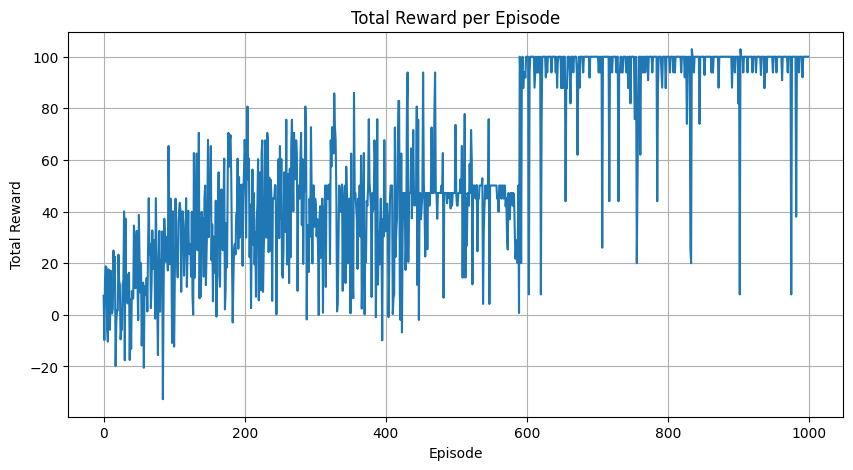

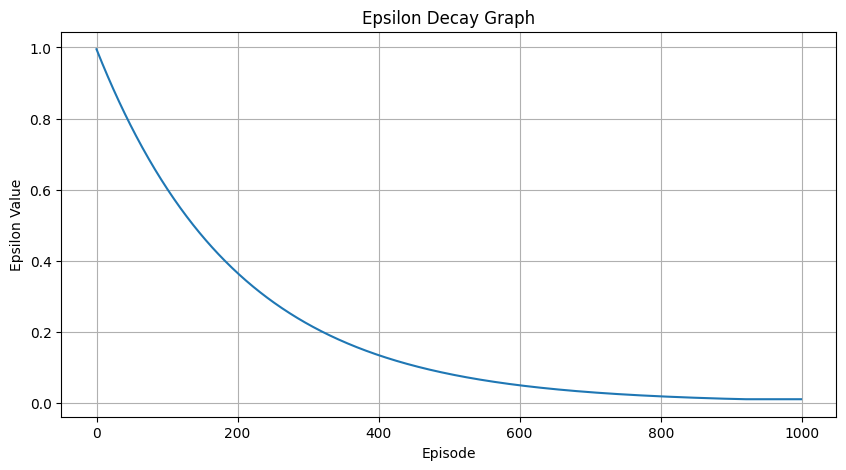

Episode 1000 Reward: 100
Episode 1000 Reward: 100
Episode 1000 Reward: 100
Episode 1000 Reward: 100
Episode 1000 Reward: 100
Episode 1000 Reward: 100
Episode 1000 Reward: 100
Episode 1000 Reward: 100
Episode 1000 Reward: 100
Episode 1000 Reward: 100


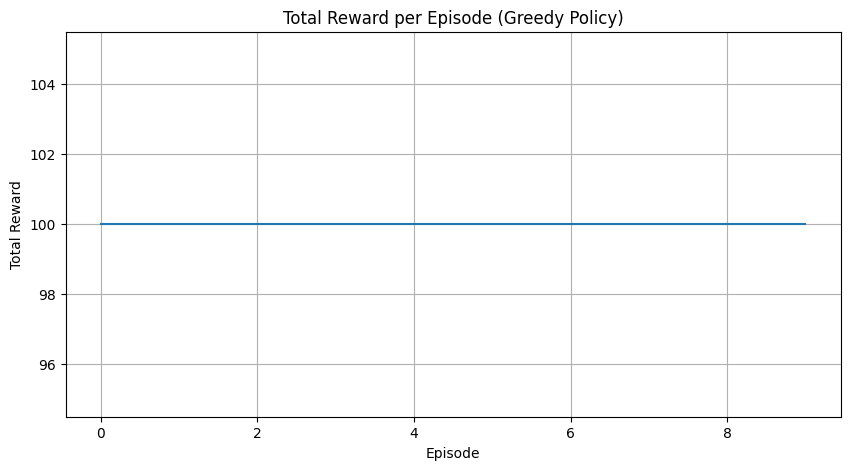

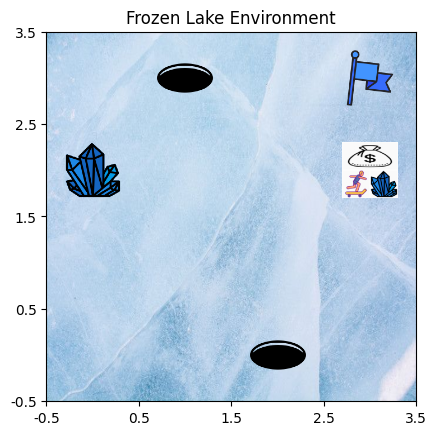

In [24]:
max_timestamp_values = [12, 15, 20]
gamma_values = [0.1, 0.5, 0.9]

for mt in max_timestamp_values:
    for gamma in gamma_values:
        env_det = FrozenLakeEnv(gamma=gamma, alpha=0.15, max_timestamp=mt)
        qt, rewards_epi, epsilon_values, final_state = training_loop(env_det, gamma, mt)
        evaluate_loop(env_det, mt, gamma, qt, rewards_epi, epsilon_values, final_state)

### Stochastic Q Learning

In [25]:
env_stoc_q = StochasticFrozenLakeEnv()

epsilon = 1.0  # Initial exploration rate
epsilon_min = 0.01  # Minimum exploration rate
gamma = 0.95  # Discount factor
alpha = 0.15  # Learning rate
decay_rate = 0.995  # Epsilon decay rate per episode
total_episodes = 1000 
max_timestamp = 10
qt = np.zeros((env_stoc_q.obs_space.n, env_stoc_q.action_space.n))

rewards_epi = []
epsilon_values = []
steps_per_episode = []
penalties_per_episode = []

final_state = None
for episode in range(total_episodes):
    state, _ = env_stoc_q.reset()
    state_index = env_stoc_q.obs_space_to_index(state)
    total_rewards = 0
    total_steps = 0  
    action = env_stoc_q.action_space.sample() if np.random.uniform(0, 1) < epsilon else np.argmax(qt[state_index])

    while True:
        next_state, reward, terminated, truncated, _ = env_stoc_q.step(action)
        total_steps += 1 
        next_strt_idx = env_stoc_q.obs_space_to_index(next_state)
        next_action = env_stoc_q.action_space.sample() if np.random.uniform(0, 1) < epsilon else np.argmax(qt[next_strt_idx])
        qt[state_index, action] = qt[state_index, action] + alpha * (reward + gamma * qt[next_strt_idx, next_action] - qt[state_index, action])
        state_index, action = next_strt_idx, next_action
        total_rewards += reward
        
        if terminated or truncated:
            break
    
    penalties_per_episode.append(env_stoc_q.get_penalty_count())  
    
    # Q-table for every 100 episodes
    if (episode + 1) % 100 == 0:
        print(f"Episode: {episode + 1}")
        print("Q-table:")
        print(qt)

        # average penalties
        avg_penalty = np.mean(penalties_per_episode[-100:])
        print(f"Average Penalties in Last 100 Episodes: {avg_penalty}")

    epsilon = max(epsilon_min, epsilon * decay_rate)
    epsilon_values.append(epsilon)
    rewards_epi.append(total_rewards)
    steps_per_episode.append(total_steps)

    if (episode + 1) % 100 == 0:
        average_steps = np.mean(steps_per_episode[-100:])
        print(f"Episode: {episode + 1}, Average Steps: {average_steps}")

    if episode == total_episodes - 1:
        final_state = env_stoc_q.state


Episode: 100
Q-table:
[[ 2.49588767  1.29572189  0.73560576  0.44308347]
 [ 2.25698753  2.91193059  3.63816669  4.06253627]
 [ 0.          0.          0.          0.        ]
 [ 0.60565859  0.19308396 -1.00511722 -1.27264956]
 [-0.72339528 -2.91163768 -1.93089225 -1.42093423]
 [ 0.44553249  0.62007369  0.89923052  1.38945162]
 [ 0.53496182 -0.27894749  1.20236894  0.38218714]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 1.72437828  0.18269782  2.05865803  0.36450268]
 [ 1.85123212  4.18174056  2.25966757  2.8963117 ]
 [ 1.44921451  1.33132113  1.39601747  6.76134944]
 [ 0.21432716 -1.03080221  0.25561593  0.44147984]
 [ 2.08713052  2.8653508   2.79029658  2.23623141]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]]
Average Penalties in Last 100 Episodes: 1.07
Episode: 100, Average Steps: 9.45
Episode: 200
Q-table:
[[ 4.09883641  1.02030308  3.05306794  1.26675769]
 [ 5.3730

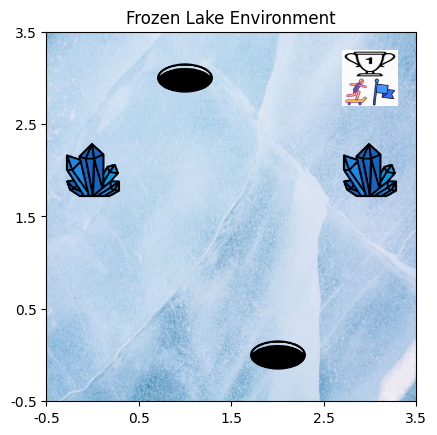

In [26]:
env_stoc_q.state = final_state
env_stoc_q.render()

Step 2:
Save the Q-table/Policy table as a pickle file or h5 of the trained model and attach it to your assignment submission.

In [28]:
import pickle
with open("models/charviku_assignment1_q_table_stochastic.pkl", 'wb') as file:
    pickle.dump(qt, file)

Step 3:

Provide the evaluation results:

(a) Print the initial Q-table and the trained Q-table

(b) Plot the total reward per episode graph (x-axis: episode, y-axis: total reward per episode).

(c) Plot the epsilon decay graph (x-axis: episode, y-axis: epsilon value)

(d) Run your environment for at least 10 episodes, where the agent chooses only greedy actions from the learned policy. Include a plot of the total reward per episode.

In [29]:
initial_qt = np.zeros((env_stoc_q.obs_space.n, env_stoc_q.action_space.n))
print("Initial Q-table:")
print(initial_qt)

Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


In [30]:
print("Trained Q-table:")
print(qt)

Trained Q-table:
[[ 7.51059002  4.88566349  4.32153824 11.417335  ]
 [ 7.2267749  13.83462875  8.0662244   8.26660967]
 [ 0.          0.          0.          0.        ]
 [-0.90979109 -0.68715641 -0.87668172  4.1927158 ]
 [ 3.06799264  5.69985942  2.775972    3.01181651]
 [ 4.36233013 10.56935959  5.31001782  5.09890049]
 [11.40683354  3.27396025  4.31354521  5.34172158]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [12.79299085  3.97208014  5.71216248  5.65276607]
 [ 7.08200378  6.57444727 18.04742475  8.31983439]
 [ 8.93851581 11.1449217  11.6537193  23.9547151 ]
 [ 9.53843047  2.56024617 -0.16189427  3.23493229]
 [ 6.78231095  7.74712675  6.65677823 11.17916311]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]]


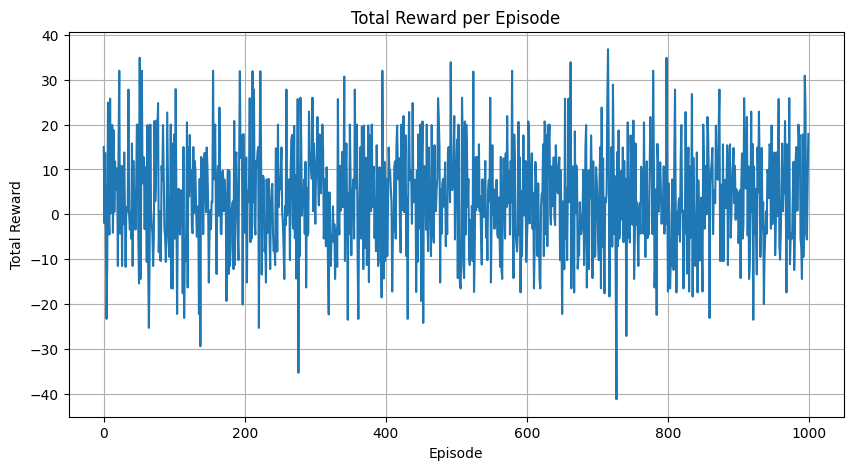

In [31]:
# total reward per episode graph
plt.figure(figsize=(10, 5))
plt.plot(rewards_epi)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Total Reward per Episode')
plt.grid(True)
plt.show()


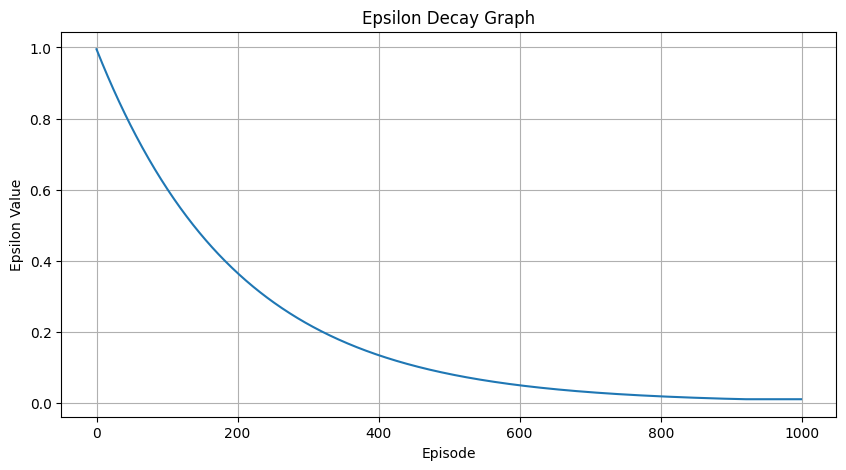

In [32]:
# epsilon decay graph
plt.figure(figsize=(10, 5))
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.title('Epsilon Decay Graph')
plt.grid(True)
plt.show()

Episode 1000 Reward: 5.4
Episode 1000 Reward: -1.3
Episode 1000 Reward: 6.7
Episode 1000 Reward: 33.8
Episode 1000 Reward: 15
Episode 1000 Reward: -9.3
Episode 1000 Reward: 7.7
Episode 1000 Reward: 9.9
Episode 1000 Reward: -8.4
Episode 1000 Reward: 6.9


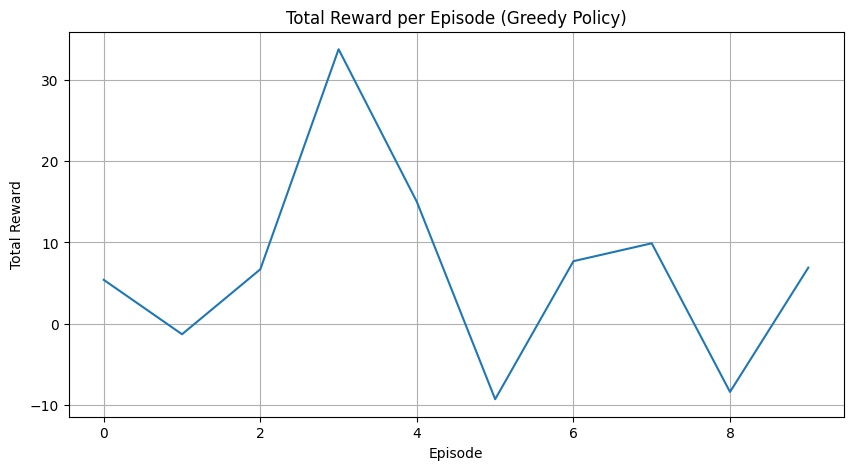

In [33]:
greedy_rewards = []
for _ in range(10):
    total_reward = 0
    state, _ = env_stoc_q.reset()
    state_index = env_stoc_q.obs_space_to_index(state)

    while True:
        action = np.argmax(qt[state_index])
        next_state, reward, terminated, truncated, _ = env_stoc_q.step(action)
        next_strt_idx = env_stoc_q.obs_space_to_index(next_state)
        total_reward += reward
        state_index = next_strt_idx
        if terminated or truncated:
            print(f"Episode {episode + 1} Reward: {round(total_reward, 4)}")
            break

    greedy_rewards.append(total_reward)

# total rewards for 10 episodes
plt.figure(figsize=(10, 5))
plt.plot(greedy_rewards)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Total Reward per Episode (Greedy Policy)')
plt.grid(True)
plt.show()

Step 4. Hyperparameter Tuning: Select at least two hyperparameters to tune to get better results for Q-learning.
You can explore hyperparameter tuning libraries, e.g. Optuna or make it manually. Parameters to
tune (select 2):

• Discount factor (γ)

• Epsilon decay rate

• Epsilon min/max values

• Number of episodes

• Max timesteps

Try at least 3 different values for each of the parameters that you choose

In [34]:
performance_dict = {}

def training_loop(env, g , max_timestamp):
    alpha = 0.15  # Learning rate
    gamma = g  # Discount factor
    epsilon = 1.0  # Initial exploration rate
    epsilon_min = 0.01  # Minimum exploration rate
    decay_rate = 0.995  # Epsilon decay rate per episode
    total_episodes = 1000
    max_timestamp = max_timestamp

    qt = np.zeros((env.obs_space.n, env.action_space.n))

    rewards_epi = []
    epsilon_values = []
    steps_per_episode = []
    penalties_per_episode = []

    final_state = None
    for episode in range(total_episodes):
        state, _ = env.reset()
        state_index = env.obs_space_to_index(state)
        total_rewards = 0
        total_steps = 0 
        action = env.action_space.sample() if np.random.uniform(0, 1) < epsilon else np.argmax(qt[state_index])

        while True:
            next_state, reward, terminated, truncated, _ = env.step(action)
            total_steps += 1 
            next_strt_idx = env.obs_space_to_index(next_state)
            next_action = env.action_space.sample() if np.random.uniform(0, 1) < epsilon else np.argmax(qt[next_strt_idx])
            qt[state_index, action] = qt[state_index, action] + alpha * (reward + gamma * qt[next_strt_idx, next_action] - qt[state_index, action])
            state_index, action = next_strt_idx, next_action
            total_rewards += reward
            
            if terminated or truncated:
                break
        
        penalties_per_episode.append(env.get_penalty_count())              
        epsilon = max(epsilon_min, epsilon * decay_rate)
        epsilon_values.append(epsilon)
        rewards_epi.append(total_rewards)
        steps_per_episode.append(total_steps)

        if episode == total_episodes - 1:
            final_state = env.state
        
    final_reward = np.mean(rewards_epi[-100:]) 
    performance_dict[(alpha, gamma, max_timestamp)] = final_reward
    return qt, rewards_epi, epsilon_values, final_state
        


In [35]:
def evaluate_loop(env, max_timestamp, gamma, qt, rewards_epi, epsilon_values, final_state):
    print(f"Max Timestamp, Gamma:  {max_timestamp}, {gamma}")

    initial_qt = np.zeros((env.obs_space.n, env.action_space.n))
    print("Initial Q-table:")
    print(initial_qt)
    print("\nTrained Q-table:")
    print(qt)


    plt.figure(figsize=(10, 5))
    plt.plot(rewards_epi)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Total Reward per Episode')
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(epsilon_values)
    plt.xlabel('Episode')
    plt.ylabel('Epsilon Value')
    plt.title('Epsilon Decay Graph')
    plt.grid(True)
    plt.show()

    greedy_rewards = []
    for _ in range(10):
        total_reward = 0
        state, _ = env.reset()
        state_index = env.obs_space_to_index(state)

        while True:
            action = np.argmax(qt[state_index])
            next_state, reward, terminated, truncated, _ = env.step(action)
            next_strt_idx = env.obs_space_to_index(next_state)
            total_reward += reward
            state_index = next_strt_idx

            if terminated or truncated:
                print(f"Episode {episode + 1} Reward: {round(total_reward, 4)}")
                break

        greedy_rewards.append(total_reward)

    plt.figure(figsize=(10, 5))
    plt.plot(greedy_rewards)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Total Reward per Episode (Greedy Policy)')
    plt.grid(True)
    plt.show()

    env.state = final_state
    env.render()   

Step 5.

Provide the evaluation results (refer to Step 3) and your explanation for each result for each hyperparameter.
In total, you should complete Step 3 seven times [Base model (step 1) + Hyperparameter #1
x 3 difference values & Hyperparameter #2 x 3 difference values]. Make your suggestion on the most
efficient hyperparameters values for your problem setup.

Max Timestamp, Gamma:  12, 0.1
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[-1.96635543 -0.49430934  0.19721442 -1.96823525]
 [ 0.67322128  0.63943664  0.64737832  2.0022102 ]
 [ 0.          0.          0.          0.        ]
 [-2.66632104 -2.45869055 -2.6006559  -2.48714496]
 [-2.24692426 -3.62497407 -3.77078439 -3.61547776]
 [-0.64546323  0.35995576 -0.4947863  -0.43139453]
 [-2.55187628 -1.5937172  -2.68084976 -2.90577385]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.48183237 -2.75364255 -1.62076109 -1.51252121]
 [ 1.90320703  0.92840022  0.90374538  0.60354342]
 [ 1.73911153 -1.06967094 -0.14660861 -0.35187752]
 [-2.08361148 -1.85183964 -2.15041995 -1.25280524]
 [ 2.60111658  0.69566649  0.8

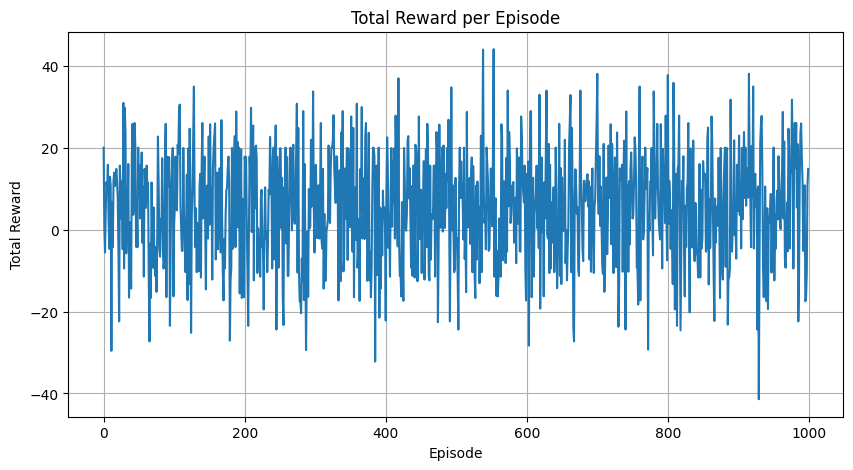

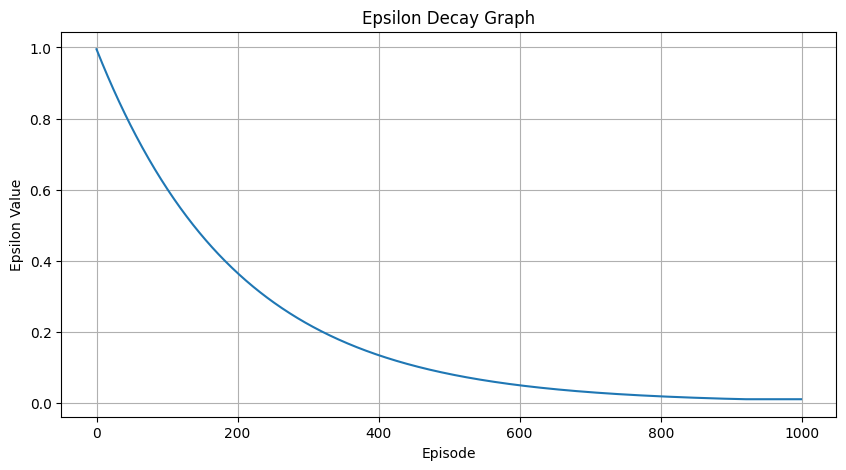

Episode 1000 Reward: 14.9
Episode 1000 Reward: -3.6
Episode 1000 Reward: 10.6
Episode 1000 Reward: 15
Episode 1000 Reward: 11.7
Episode 1000 Reward: 17.4
Episode 1000 Reward: 0.8
Episode 1000 Reward: -5.5
Episode 1000 Reward: 3.6
Episode 1000 Reward: 10.5


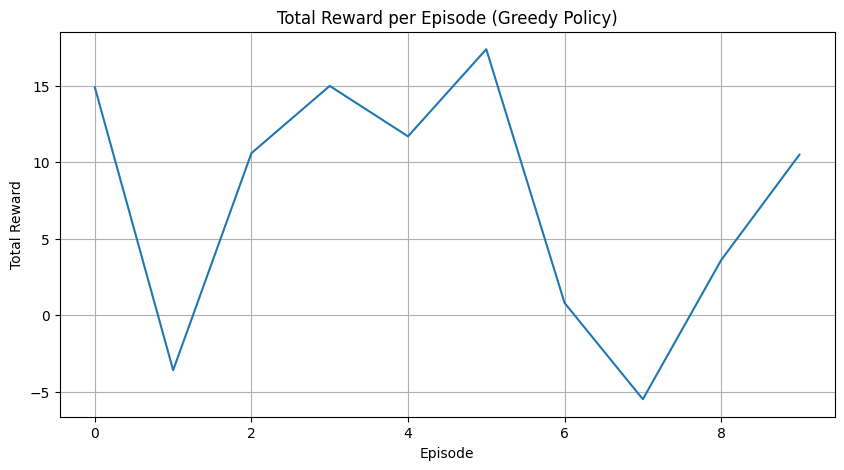

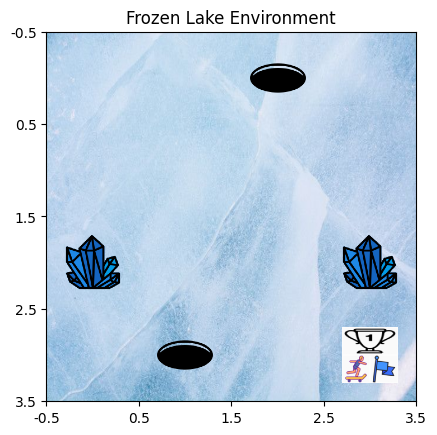

Max Timestamp, Gamma:  12, 0.5
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[-1.77289134 -2.35469437  1.69684186 -1.85158706]
 [ 1.85691265  1.07870353  1.39350214  1.14637841]
 [ 0.          0.          0.          0.        ]
 [-3.14591751 -1.77188668 -3.1754428  -3.08832414]
 [-3.87871113 -3.81312887 -3.75625623 -0.90182772]
 [-0.16226591 -0.34659234 -0.18813533  0.66891387]
 [-1.76283075 -2.61933678 -2.52369974  0.85747133]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [-1.53439244 -1.52224706 -1.68193036  1.82721139]
 [ 1.05100001  2.02353064  1.68063846  3.92319184]
 [ 1.74718967  0.90607921  1.06935882  6.35844092]
 [ 0.86034702 -1.40413311 -1.94325365 -1.94122169]
 [ 0.44121815  3.59868872  0.5

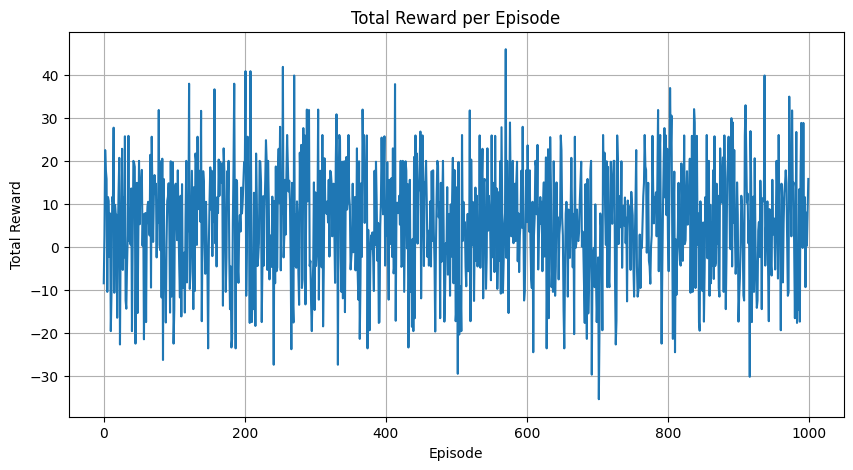

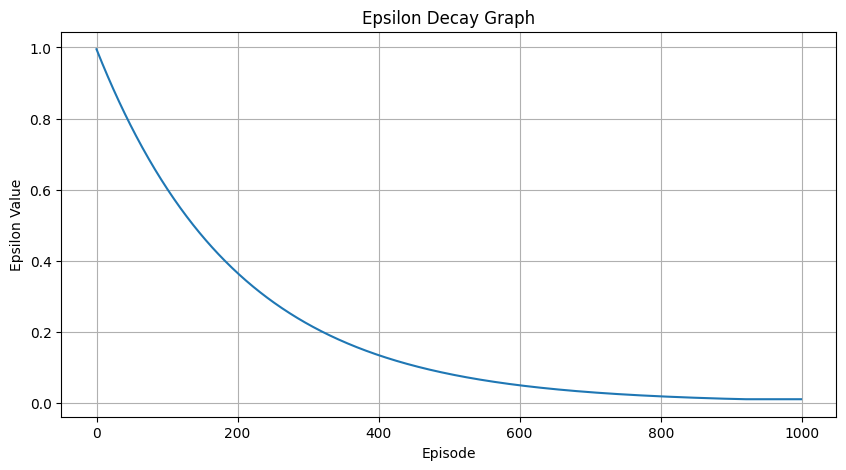

Episode 1000 Reward: 8.7
Episode 1000 Reward: -7.3
Episode 1000 Reward: 0.7
Episode 1000 Reward: 2.7
Episode 1000 Reward: 0.5
Episode 1000 Reward: -17.5
Episode 1000 Reward: 3.6
Episode 1000 Reward: -12.2
Episode 1000 Reward: 17.8
Episode 1000 Reward: 11.9


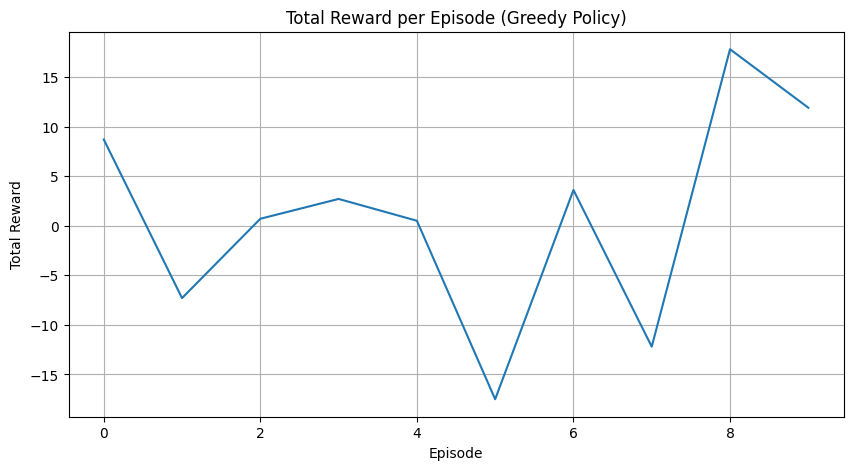

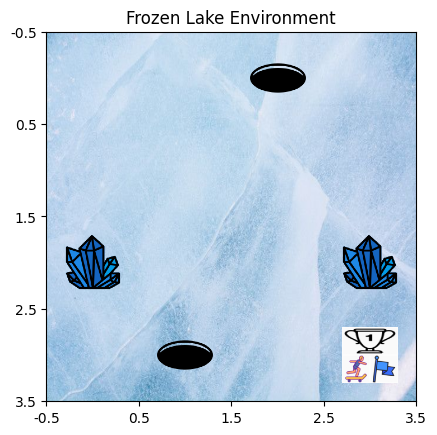

Max Timestamp, Gamma:  12, 0.9
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 1.69516404  3.3022306   2.00920678  1.4699387 ]
 [ 5.83677974  4.75339411  4.89099077  7.24274227]
 [ 0.          0.          0.          0.        ]
 [-0.98348335 -1.22935043 -1.06118758 -1.32986484]
 [ 0.88712784 -0.13440896 -0.12539386 -0.6058754 ]
 [ 3.33902026  4.09537245  4.99819385  3.9655761 ]
 [ 6.11854507  0.46969144  2.55887371  2.26456076]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 3.83799002  2.84612141  2.92843518  3.59908126]
 [ 6.39043708  6.46509156  7.28272515  7.16781898]
 [ 9.2422076  10.21587256  6.68530351  8.15099547]
 [ 0.96926954  1.05152018  4.14547135  0.78718774]
 [ 2.8771355   5.1440882   5.0

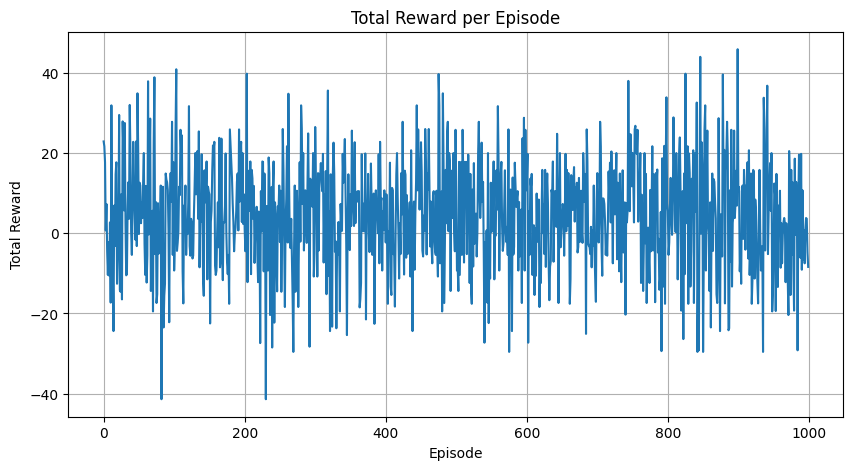

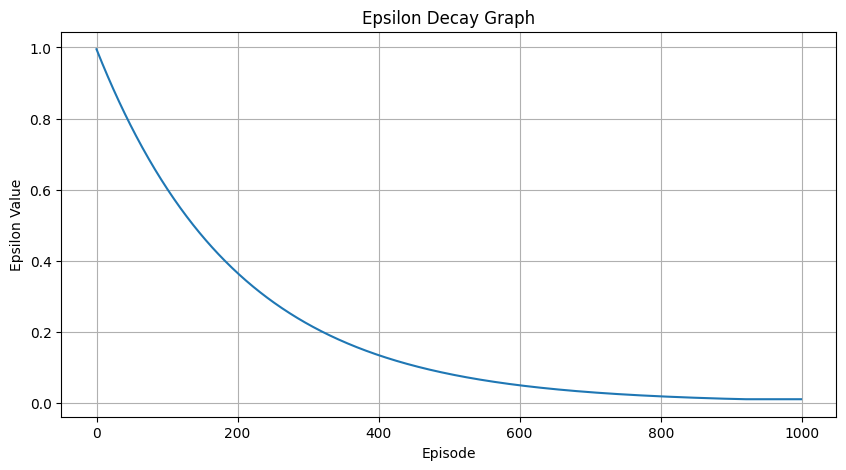

Episode 1000 Reward: 0.1
Episode 1000 Reward: 17.6
Episode 1000 Reward: -14.6
Episode 1000 Reward: -2.2
Episode 1000 Reward: 14.6
Episode 1000 Reward: 20
Episode 1000 Reward: 0.5
Episode 1000 Reward: 32.9
Episode 1000 Reward: 19.7
Episode 1000 Reward: -10.6


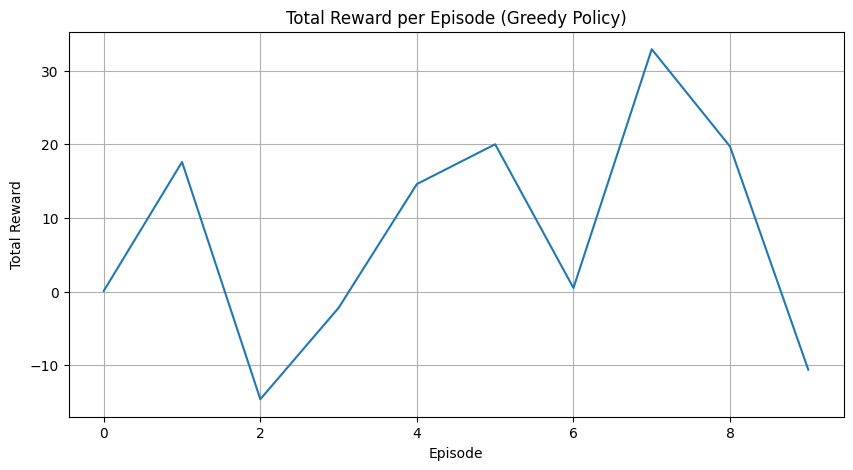

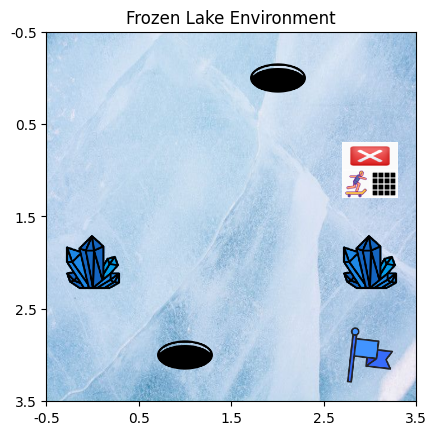

Max Timestamp, Gamma:  15, 0.1
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[-1.95368003 -0.04576217 -1.53196222 -1.57056354]
 [ 2.75703875  0.5572074   0.61795917  0.70166496]
 [ 0.          0.          0.          0.        ]
 [-0.35642209 -2.49445413 -3.05242179 -2.47565374]
 [-3.55565115 -3.69119606 -3.40874015 -3.36117661]
 [-0.20642412 -0.28104321 -0.25519346 -0.04158803]
 [-2.80171764 -0.09370637 -2.16178502 -2.4727754 ]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 0.40543167 -2.07769494 -1.46482642 -2.08058604]
 [ 0.88917087  1.37482168  0.36184411  0.42317915]
 [-0.67112767 -0.61741909 -0.21815153  6.10074343]
 [-1.71845463 -1.19031018 -2.37587251 -2.85207465]
 [ 0.27897604  3.82788358  0.2

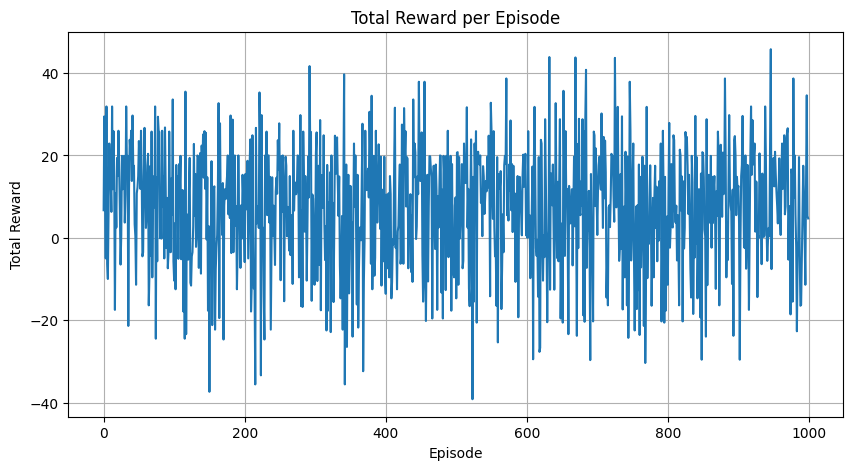

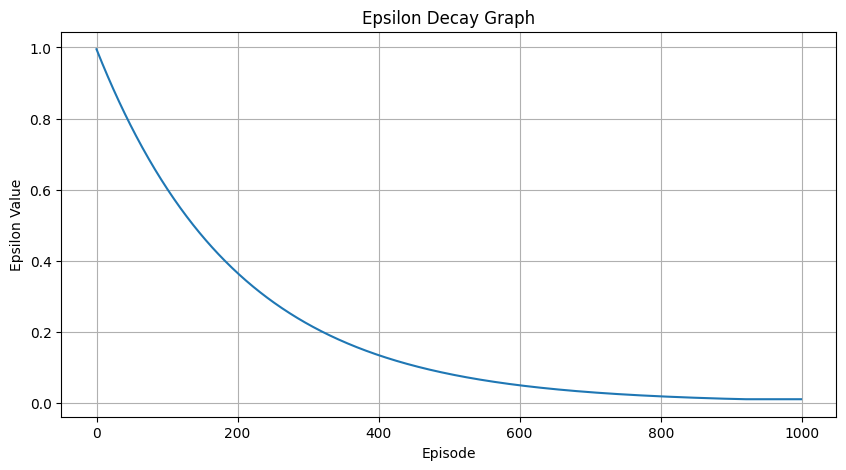

Episode 1000 Reward: 12.4
Episode 1000 Reward: 19.3
Episode 1000 Reward: 0.2
Episode 1000 Reward: 7.7
Episode 1000 Reward: 0.6
Episode 1000 Reward: 15.5
Episode 1000 Reward: 14.8
Episode 1000 Reward: 4.8
Episode 1000 Reward: 14.4
Episode 1000 Reward: 20


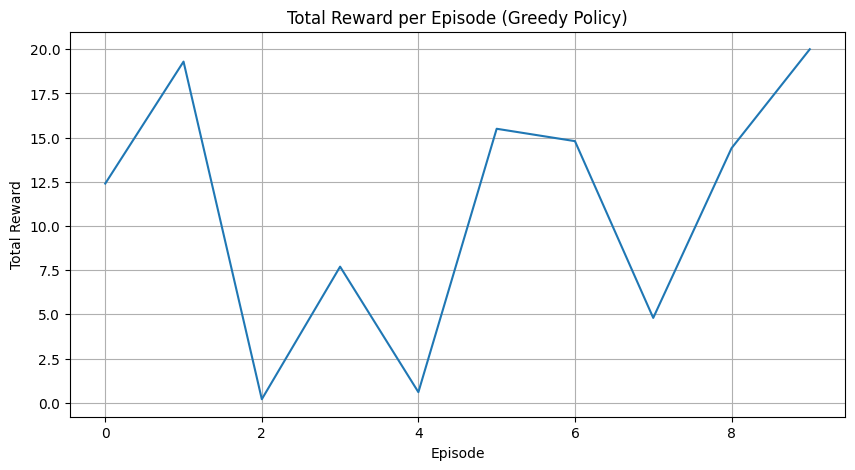

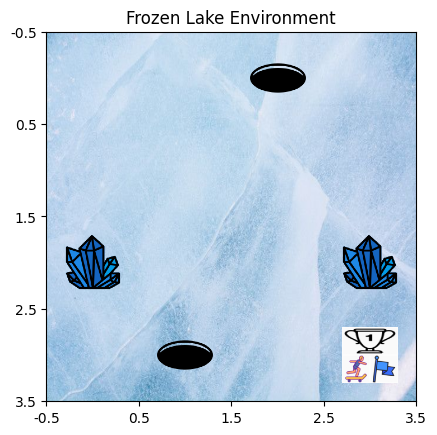

Max Timestamp, Gamma:  15, 0.5
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[-1.98633916  0.26320962  1.37825848  0.20029089]
 [ 0.95436683  1.08409909  1.67166254  1.64254776]
 [ 0.          0.          0.          0.        ]
 [-1.19962284 -2.79265084 -2.0050264  -3.08006359]
 [-3.71461921 -3.65368168 -3.88573129 -0.518607  ]
 [-0.09688112 -0.03393981  0.70563122  0.0744905 ]
 [ 1.97980917 -1.69925284 -1.52064646 -2.31942658]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [-1.41997948  0.25197458 -1.87688969 -1.75263881]
 [ 3.19915068  1.75987291  1.61055576  1.25283145]
 [ 1.18090992  1.9354343   1.63748776 10.15976621]
 [-2.70533659 -2.3728239   0.96582907 -2.55534312]
 [ 0.19960775  0.73800476  4.8

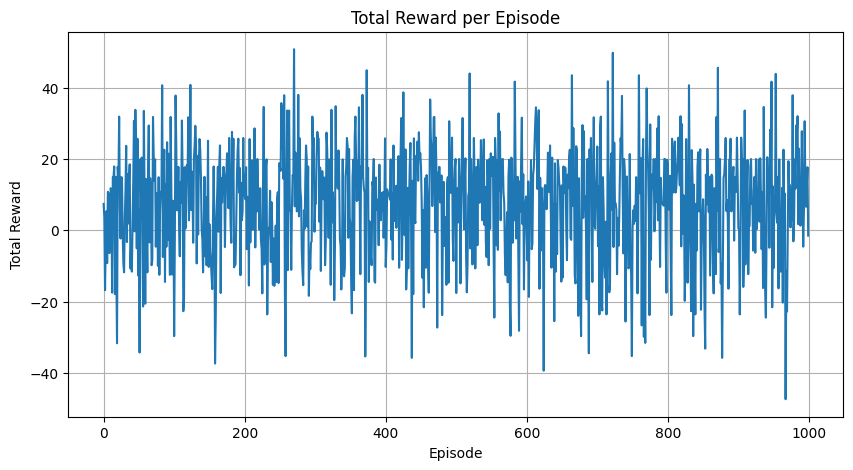

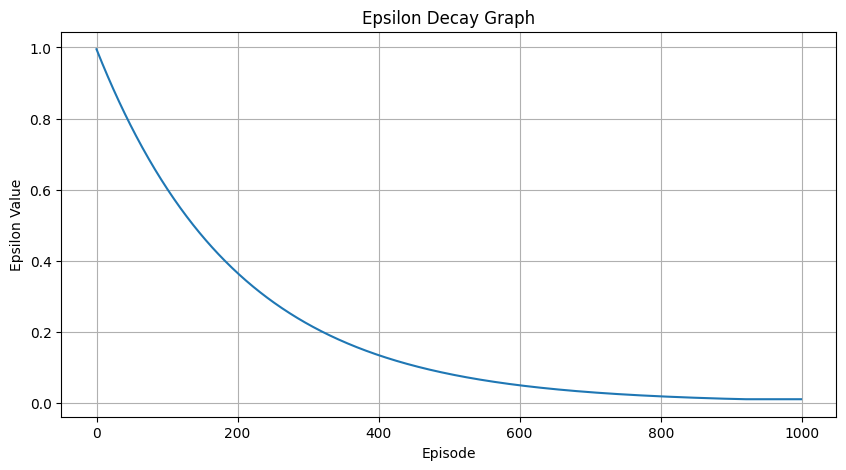

Episode 1000 Reward: -11.8
Episode 1000 Reward: -27.4
Episode 1000 Reward: 25.8
Episode 1000 Reward: -0.1
Episode 1000 Reward: 19.9
Episode 1000 Reward: 29.7
Episode 1000 Reward: 29.8
Episode 1000 Reward: 11.8
Episode 1000 Reward: 15.7
Episode 1000 Reward: 6.7


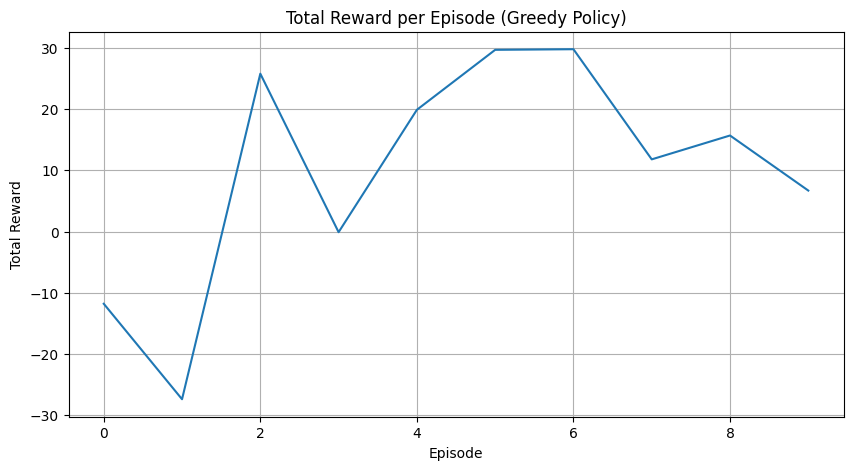

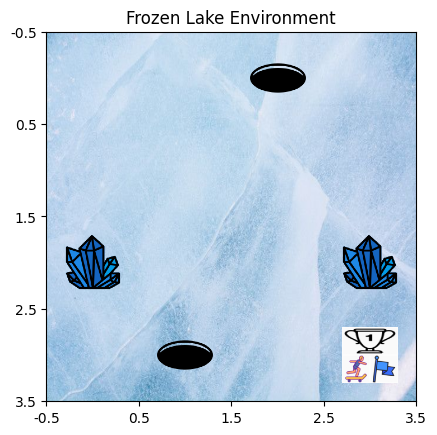

Max Timestamp, Gamma:  15, 0.9
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 3.37174987  2.72312314  7.99469084  2.84003809]
 [ 6.69852743  7.59345918  6.66981564  6.61510781]
 [ 0.          0.          0.          0.        ]
 [-0.02661941  0.76188233  4.56116657  0.23747665]
 [ 1.50122603  1.28994429  1.12953049  1.19178861]
 [ 4.82595961  5.54828142  4.4044286   5.00491135]
 [ 2.89263779  3.84154379  5.13377999  3.47054851]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 5.53405417  7.77418101  5.37105551  4.70631274]
 [ 7.84921471 10.51671377  7.52475313  7.37444794]
 [ 7.60180328  8.35816902  7.57442157 12.29664813]
 [ 2.2320669   2.41611526  6.10809584  1.623016  ]
 [ 5.68780632  9.20704342  5.8

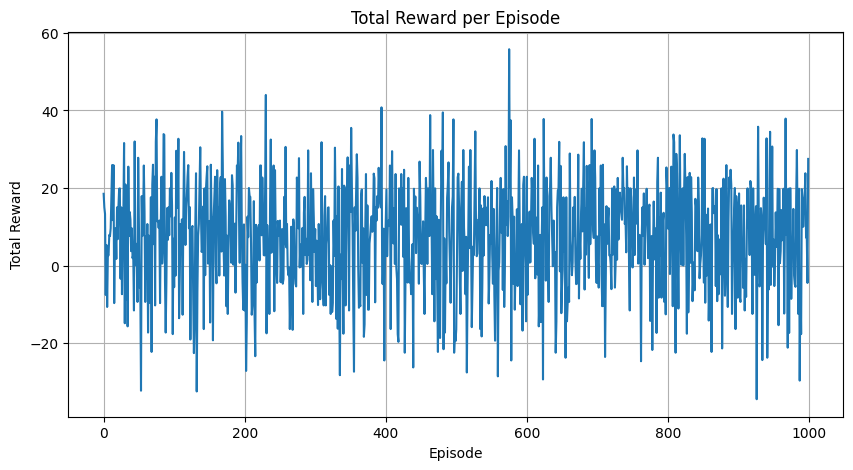

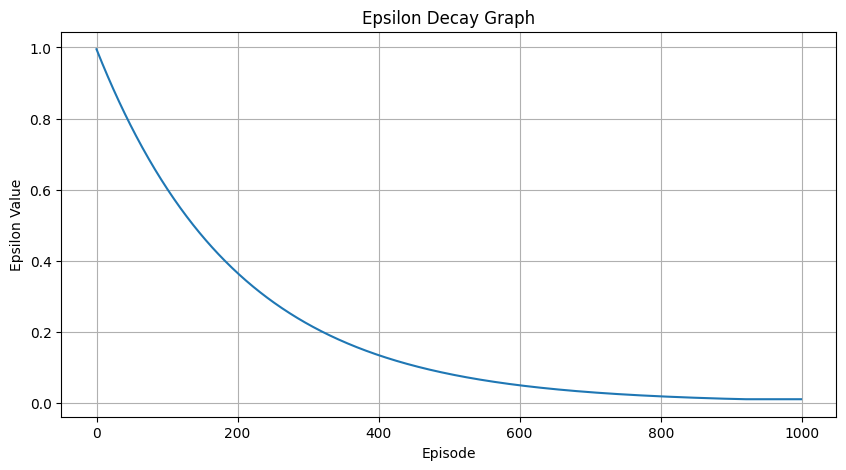

Episode 1000 Reward: 29.8
Episode 1000 Reward: 17.8
Episode 1000 Reward: 25.7
Episode 1000 Reward: 19.7
Episode 1000 Reward: -0.6
Episode 1000 Reward: 4.9
Episode 1000 Reward: 17.9
Episode 1000 Reward: -28.3
Episode 1000 Reward: 20.6
Episode 1000 Reward: 13.9


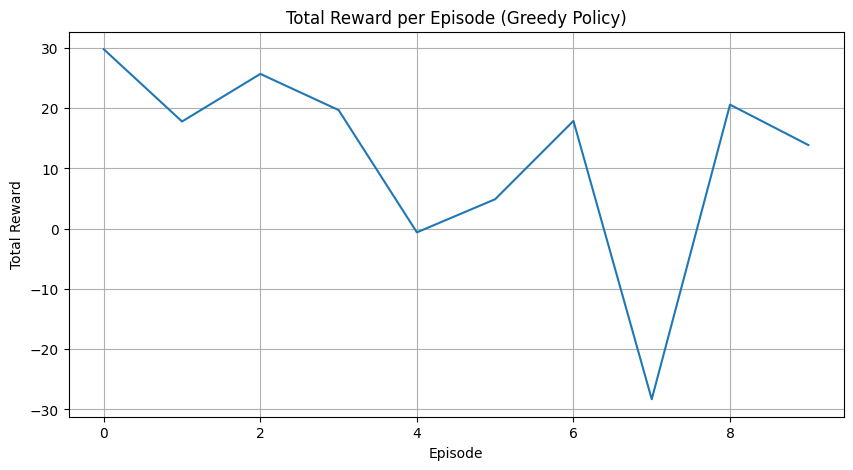

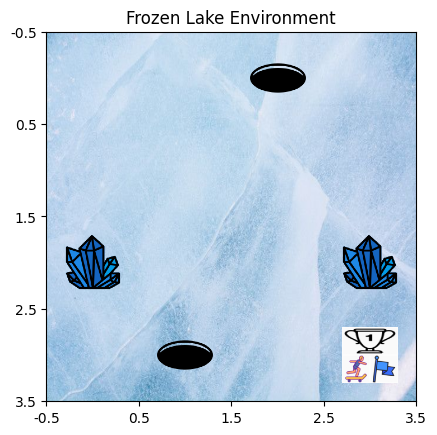

Max Timestamp, Gamma:  20, 0.1
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 1.57051737 -2.33850708 -1.72672238 -1.74176309]
 [ 0.7650009   0.77946289  0.8784307   3.01130214]
 [ 0.          0.          0.          0.        ]
 [-2.85712743 -2.33374121  0.14086095 -2.96551504]
 [-3.96634745 -3.86726348 -2.73044055 -4.00747208]
 [-0.24134663  0.73763763 -0.30414713 -0.09059604]
 [-2.97306884  1.54805982 -3.06357264 -3.18821777]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [-0.9905033  -1.97019199 -2.19055565 -1.94906308]
 [ 0.63113309  1.20867419  1.86500499  0.57938691]
 [-1.15040328 -0.99778654  3.73021702 -1.29741642]
 [-2.21654913 -0.24796544 -2.26496    -2.68004383]
 [ 0.15148815  2.70689212  0.0

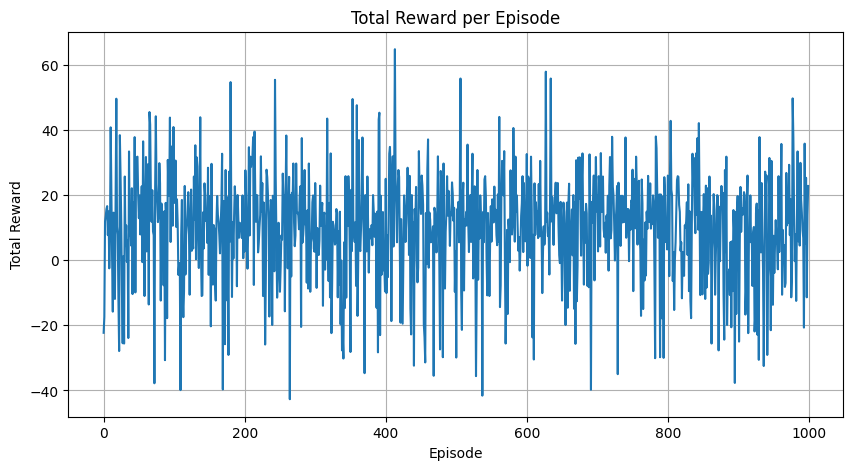

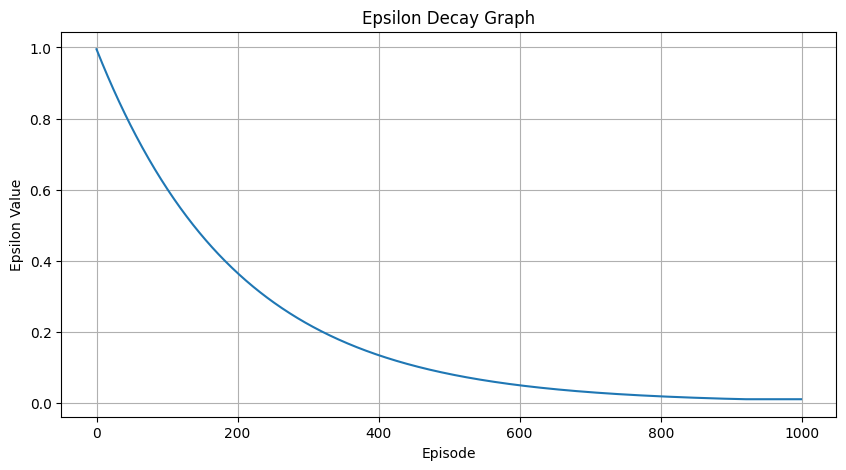

Episode 1000 Reward: -15.0
Episode 1000 Reward: -14.6
Episode 1000 Reward: -5.9
Episode 1000 Reward: 7.1
Episode 1000 Reward: 25.7
Episode 1000 Reward: 22.0
Episode 1000 Reward: 12.6
Episode 1000 Reward: 7.3
Episode 1000 Reward: 9.6
Episode 1000 Reward: -32.5


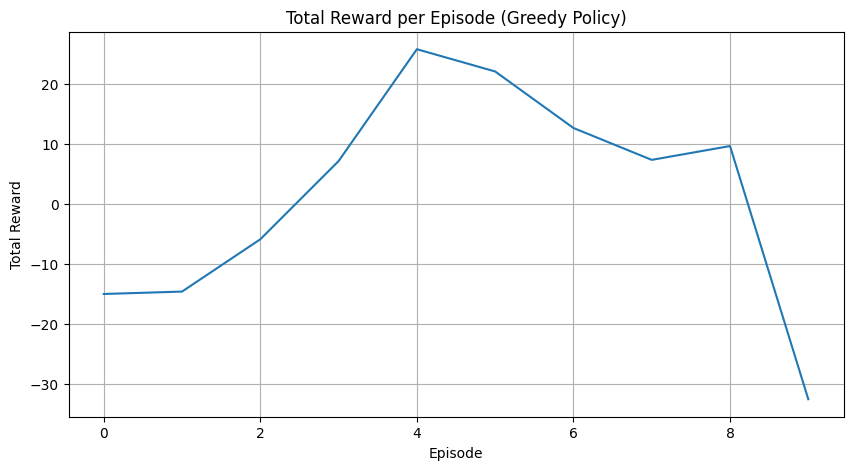

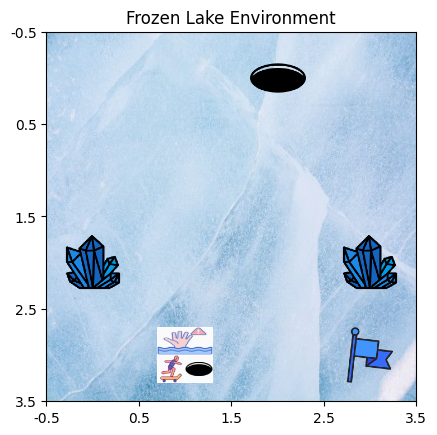

Max Timestamp, Gamma:  20, 0.5
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[-1.99883071 -0.17999572  0.09048963 -1.28240938]
 [ 1.42648386  1.30631443  3.16969287  1.04824258]
 [ 0.          0.          0.          0.        ]
 [-2.52968096 -1.10153798 -2.75632112 -2.39936933]
 [-3.7365163  -3.84558256 -1.30343918 -3.22564146]
 [-0.28317667 -0.42653066 -0.31279535  0.70691867]
 [-2.01832266 -2.39585915 -0.56807086 -2.57717853]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [-0.88003706  1.28192473 -0.67276963 -1.20607488]
 [ 1.4932495   3.58544267  1.82838253  1.1377652 ]
 [ 0.80851681  2.10909355  0.26499902  0.28916173]
 [-2.14740613 -2.36666633 -0.68073404 -2.02315114]
 [ 2.99823659  0.84065548  0.8

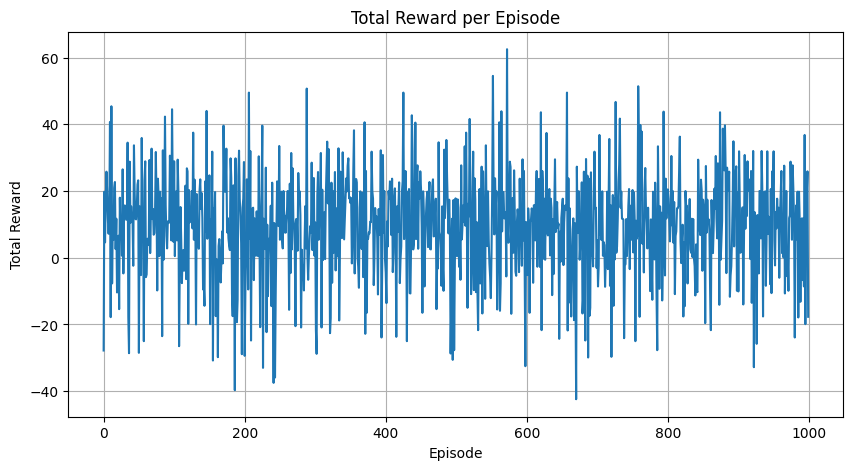

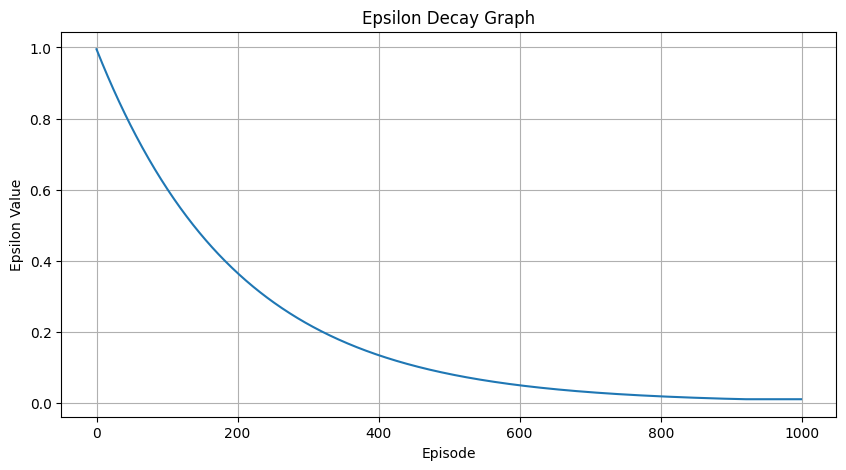

Episode 1000 Reward: 11.4
Episode 1000 Reward: 27.9
Episode 1000 Reward: 27.6
Episode 1000 Reward: -4.9
Episode 1000 Reward: 17.7
Episode 1000 Reward: 14.7
Episode 1000 Reward: 4.3
Episode 1000 Reward: 7.8
Episode 1000 Reward: 3.5
Episode 1000 Reward: -4.9


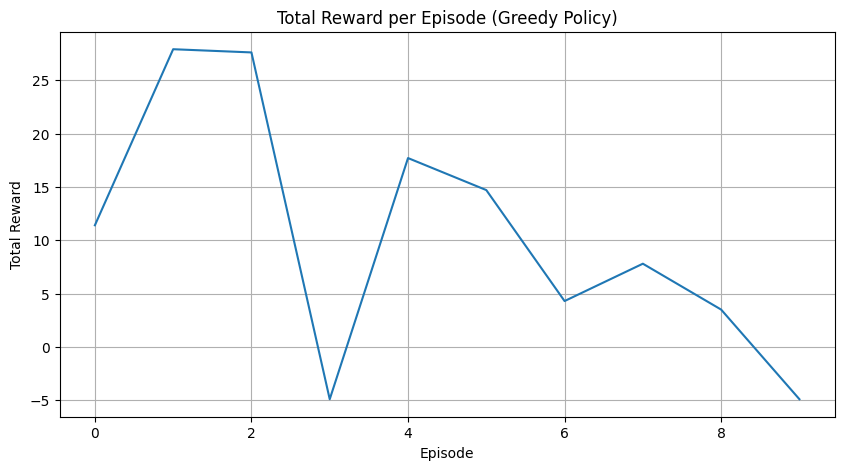

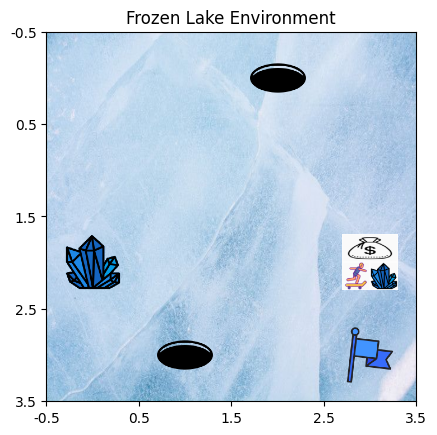

Max Timestamp, Gamma:  20, 0.9
Initial Q-table:
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]

Trained Q-table:
[[ 3.66131115  6.00760514  3.75467548  4.07123743]
 [ 6.58540295  8.37490459  6.38864734  6.42185488]
 [ 0.          0.          0.          0.        ]
 [ 0.54749696  0.78999371  0.56259884  2.76652067]
 [ 0.39626518  3.83103584  0.65232835  2.03955312]
 [ 4.20007008  4.93866394  4.87178124  6.45332485]
 [ 3.72730712  2.50692939  6.57381783  2.69973478]
 [ 0.          0.          0.          0.        ]
 [ 0.          0.          0.          0.        ]
 [ 9.83383358  4.57429977  4.58379155  4.12767697]
 [ 8.54380187 13.85945496  7.14887863  8.17705639]
 [ 8.768216    8.71057797 15.96915252  7.60044338]
 [ 4.77849246  2.07341944  2.49909868  1.97233703]
 [ 6.36755705  6.01815315  7.3

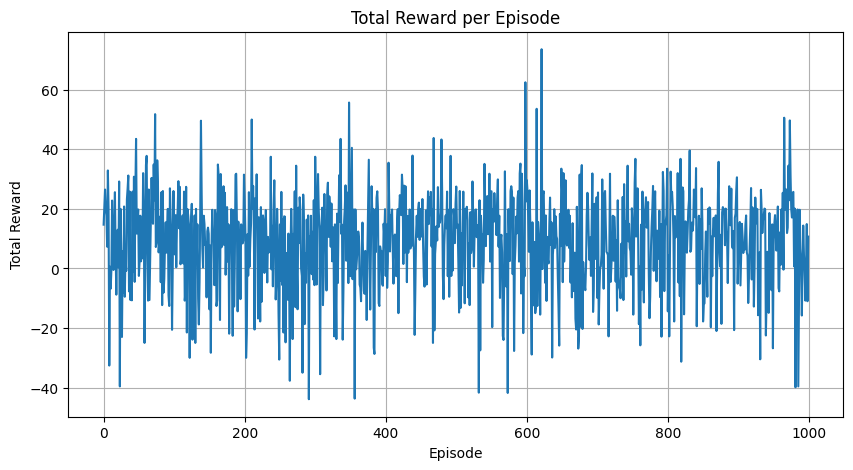

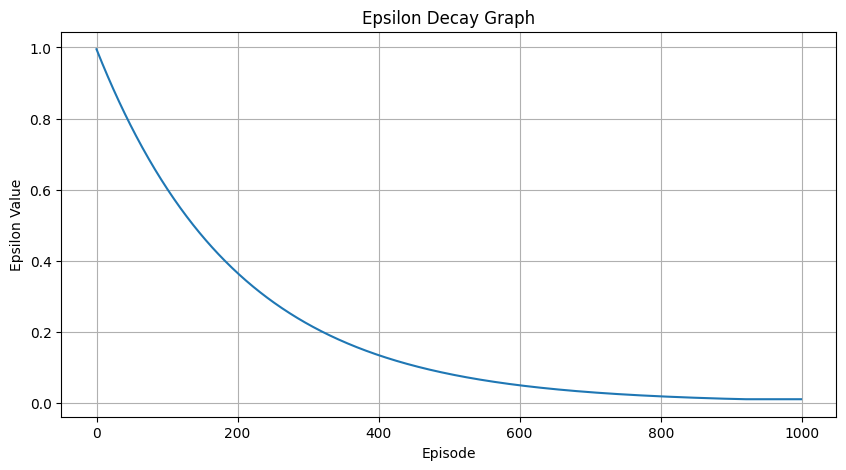

Episode 1000 Reward: 19.6
Episode 1000 Reward: 14.4
Episode 1000 Reward: 26.8
Episode 1000 Reward: 22.5
Episode 1000 Reward: -32.3
Episode 1000 Reward: 0.6
Episode 1000 Reward: 0.6
Episode 1000 Reward: -0.2
Episode 1000 Reward: 14.9
Episode 1000 Reward: 19.8


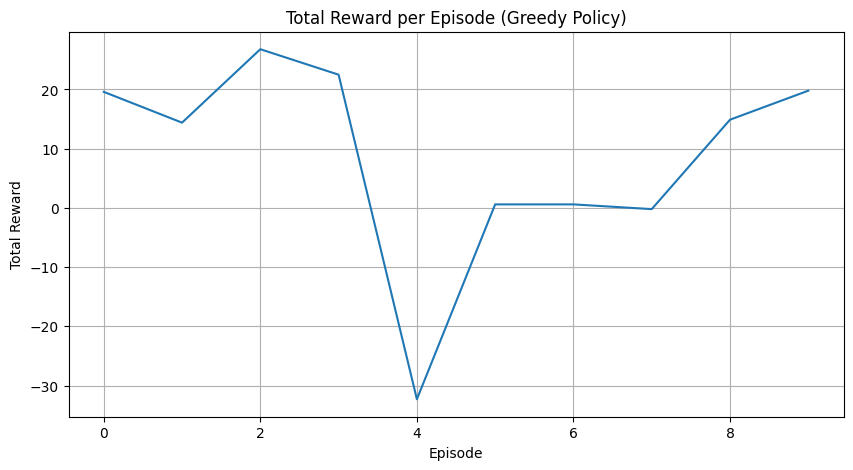

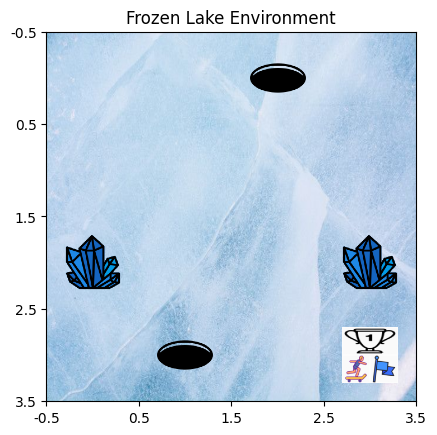

In [ ]:
max_timestamp_values = [12, 15, 20]
gamma_values = [0.1, 0.5, 0.9]

for mt in max_timestamp_values:
    for gamma in gamma_values:
        env_stoc = StochasticFrozenLakeEnv(gamma=gamma, alpha=0.15, max_timestamp=mt)
        qt, rewards_epi, epsilon_values, final_state = training_loop(env_stoc, gamma, mt)
        evaluate_loop(env_stoc, mt, gamma, qt, rewards_epi, epsilon_values, final_state)